In [1]:
print("Hola Mundo, Vamos a crear una nuevo proyecto para la clasificación de imágenes...")


Hola Mundo, Vamos a crear una nuevo proyecto para la clasificación de imágenes...


# Librerias para procesamiento de datos, visualización, imágenes

In [2]:
import os
import random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
from tqdm import tqdm
from pathlib import Path
import cv2
from math import ceil
import itertools
%matplotlib inline


# Librerias para procesamiento de imágenes, modelos, capas, red neural

In [4]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array
from tensorflow.keras.models import Sequential, load_model,Model
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, GlobalAveragePooling2D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.applications import ResNet50, EfficientNetB0
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
from sklearn.metrics import classification_report, confusion_matrix

In [68]:
data_dir =  'G:/Intel/'
data_train = 'G:/Intel/seg_train'
data_test = 'G:/Intel/seg_test'
data_path = 'G:/Intel/seg_train'

nuevo_data_path = 'G:/Intel/data_train'
nuevo_data_test = 'G:/Intel/data_test'
nuevo_data_pred = 'G:/Intel/data_pred'

train_dir = os.path.join(data_dir, 'seg_train')
test_dir = os.path.join(data_dir, 'seg_test')
pred_dir = os.path.join(data_dir, 'seg_pred')

# Clases que contiene el dataset para train y test

In [8]:
clases_train = os.listdir(data_train)
print('Clases del Dataset: ', clases_train)

Clases del Dataset:  ['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']


In [44]:
clases_test = os.listdir(data_test)
print('Clases del Dataset: ', clases_test)

Clases del Dataset:  ['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']


In [22]:
clases = os.listdir(data_path)
print('Clases del Dataset: ', clases)

Clases del Dataset:  ['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']


# Vamos a hacer una primera visualización de una imágen por cada clase.

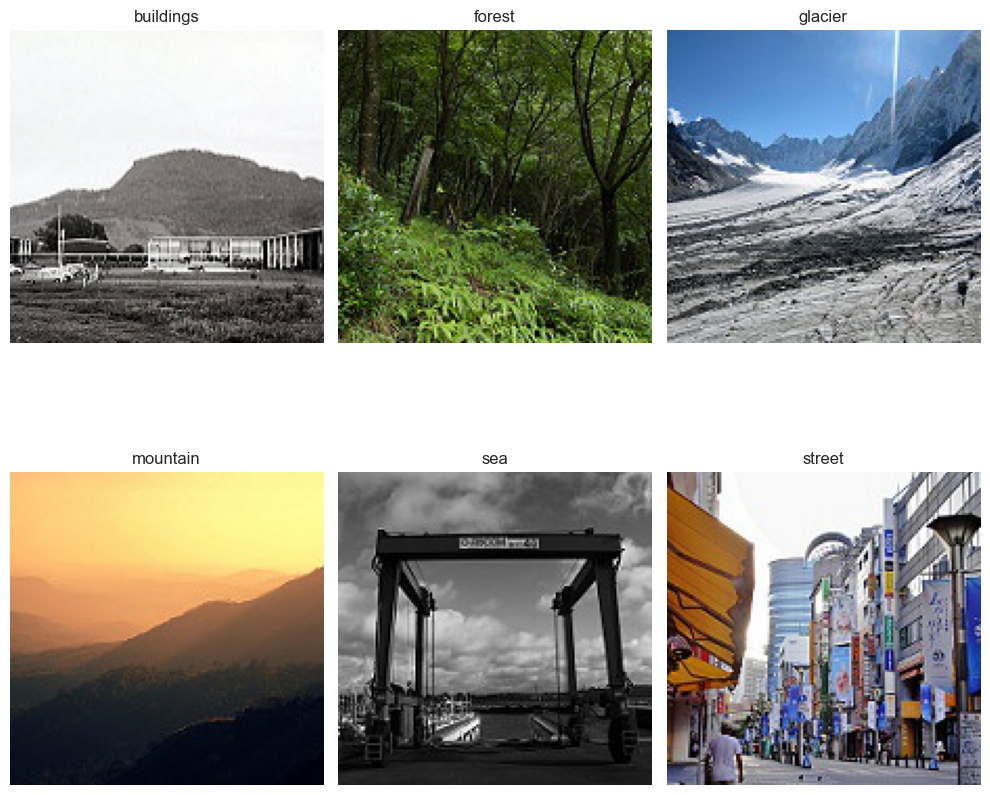

In [21]:
plt.figure(figsize=(10, 10))

for i, clase in enumerate(clases_train):
    img_folder = os.path.join(data_train, clase)
    img_file = os.listdir(img_folder)[0]
    img_path = os.path.join(img_folder, img_file)

    imagen = Image.open(img_path)

    plt.subplot(2, 3, i + 1)
    plt.imshow(imagen)
    plt.title(clase)
    plt.axis('off')

plt.tight_layout()
plt.show()

# Cuantas imágenes tenemos por cada clase

In [24]:
imagen_por_clase = {}

for clase in clases:
    ruta = os.path.join(data_path, clase)
    conteo = len(os.listdir(ruta))
    imagen_por_clase[clase] = conteo

print('Numero de imágenes por cada clase:')
for clase, cantidad in  imagen_por_clase.items():
    print(f'{clase}: {cantidad}')

Numero de imágenes por cada clase:
buildings: 2191
forest: 2271
glacier: 2404
mountain: 2512
sea: 2274
street: 2382


# Distribución de Dimensiones

In [25]:
dimensiones = []

for clase in clases:
    ruta = os.path.join(data_path, clase)
    for img_file in tqdm(os.listdir(ruta), desc=f'Procesando {clase}'):
        img_path = os.path.join(ruta, img_file)
        try:
            with Image.open(img_path) as img:
                dimensiones.append(img.size)
        except:
            continue

Procesando street: 100%|██████████| 2382/2382 [00:33<00:00, 71.25it/s]


In [26]:
dimensiones = np.array(dimensiones)
anchos = dimensiones[:, 0]
altos = dimensiones[:, 1]

# Vamos a graficar en Histogramas loa valores de alto y ancho

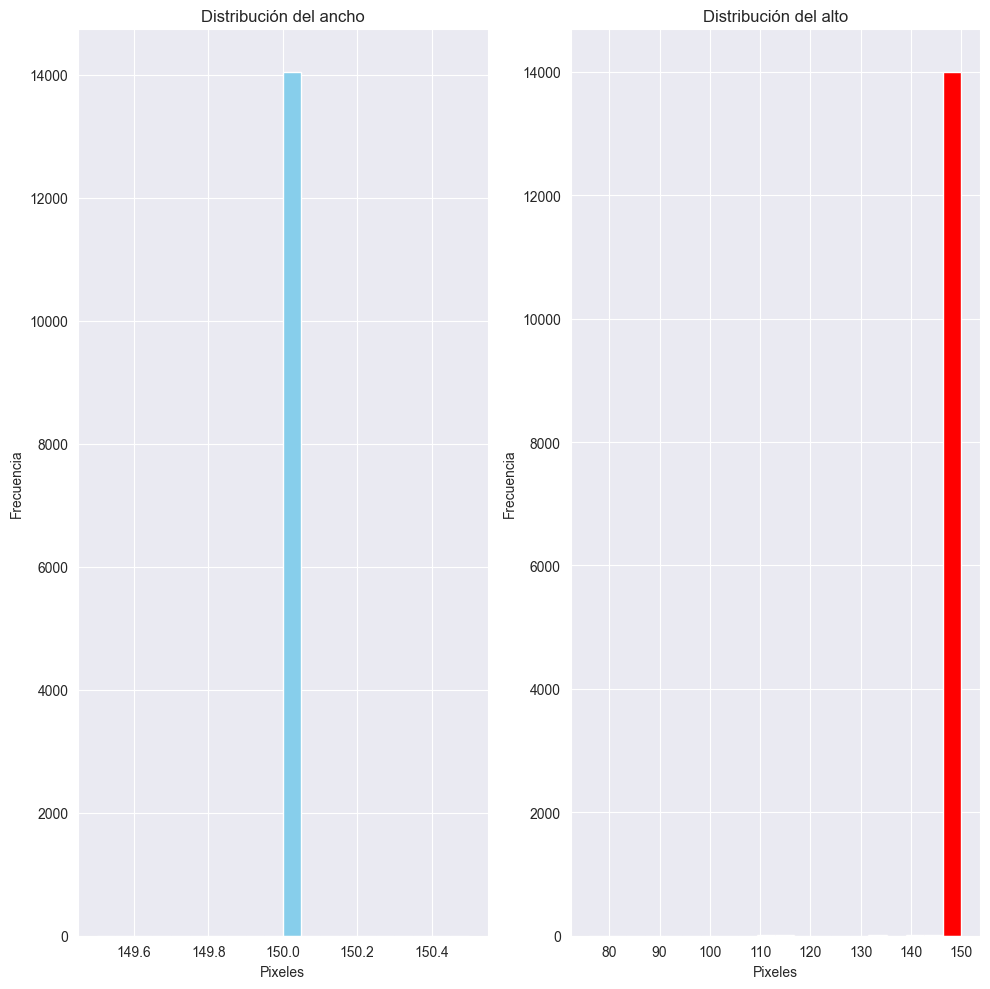

In [29]:
plt.figure(figsize=(10,10))
plt.subplot(1, 2, 1)
plt.hist(anchos, bins=20, color='skyblue')
plt.title('Distribución del ancho')
plt.xlabel('Pixeles')
plt.ylabel('Frecuencia')

plt.subplot(1, 2, 2)
plt.hist(altos, bins=20, color='red')
plt.title('Distribución del alto')
plt.xlabel('Pixeles')
plt.ylabel('Frecuencia')

plt.tight_layout()
plt.show()

# Vamos a crear una funcion que nos calcule el promedio RGB por cada clase

In [30]:
def rgb_clase(imagen):
    imagen = imagen.resize((64,64))
    imagen_np = np.array(imagen)
    if imagen_np.ndim == 3:
        return [np.mean(imagen_np[:,:,i]) for i in range(3)]
        return [0,0,0]

# Guardamos los resultados de la función

In [31]:
promedios_rgb = {}

In [32]:
for clase in clases:
    carpeta = os.path.join(data_path, clase)
    rgb_totales = np.zeros(3)
    contador = 0

    for img_file in os.listdir(carpeta)[:100]:
        ruta = os.path.join(carpeta, img_file)
        try:
            img = Image.open(ruta)
            rgb = rgb_clase(img)
            rgb_totales += rgb
            contador += 1
        except:
            continue

    promedios_rgb[clase] = rgb_totales/ max(contador, 1)


# Creamos un nuevo DataFrame

In [33]:
df_rgb = pd.DataFrame(promedios_rgb, index=['Red', 'Green', 'Blue'])

# Gráficamos los datos de nuestro nuevo DataFrame

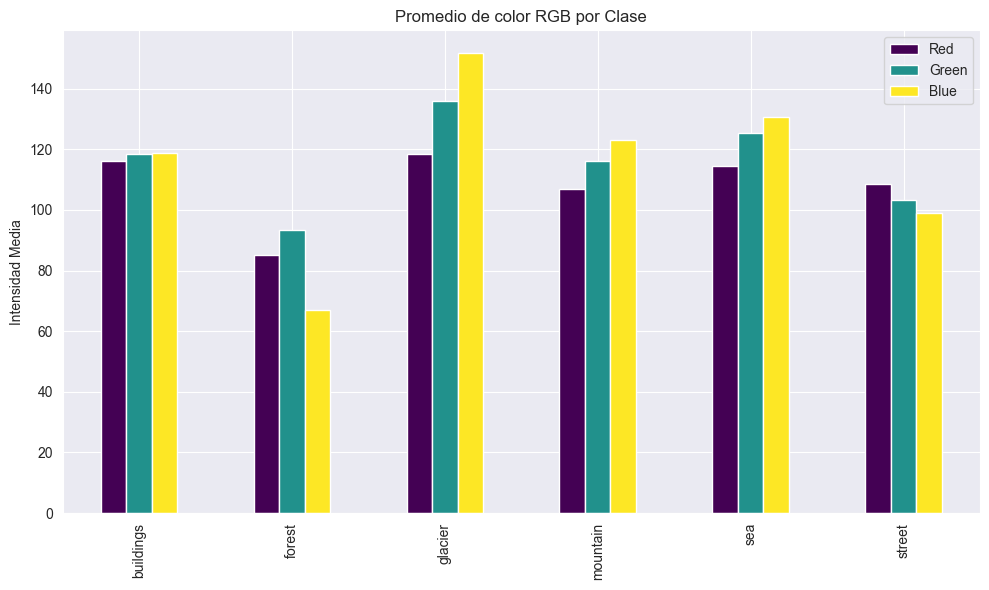

In [34]:
df_rgb.T.plot(kind='bar', figsize=(10,6), colormap='viridis')
plt.title('Promedio de color RGB por Clase')
plt.ylabel('Intensidad Media')
plt.xticks(rotation=90)
plt.grid=True
plt.tight_layout()
plt.show()

# Vamos a crear una mosaico de 3 imágenes de forma aleatoria por cada clase

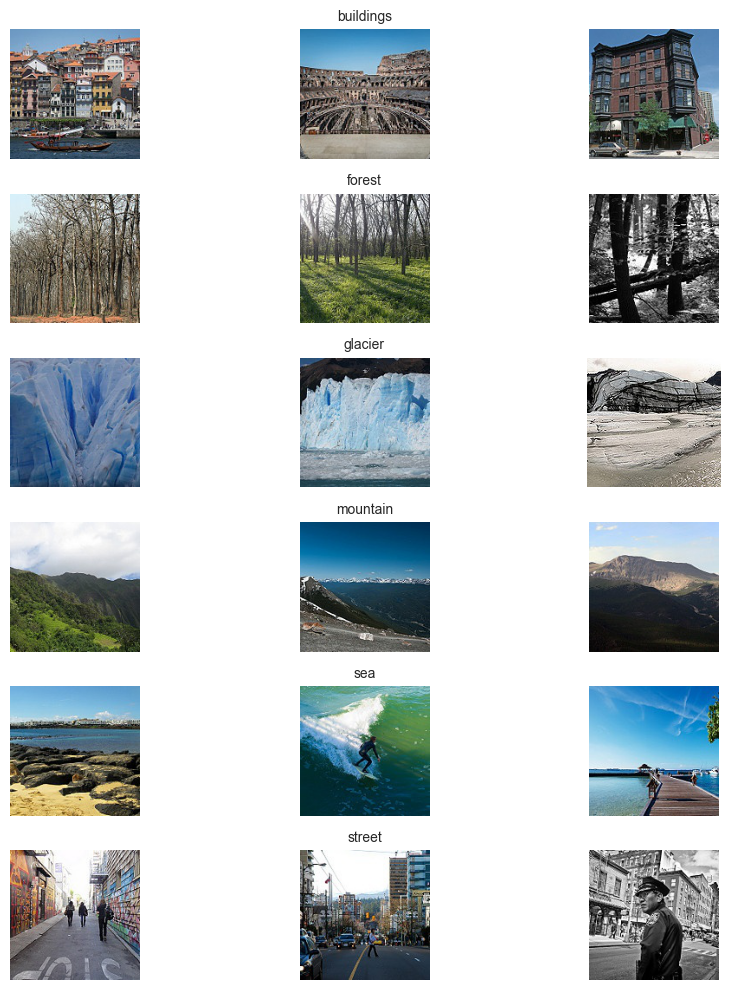

In [37]:
plt.figure(figsize=(10,10))
for i, clase in enumerate(clases):
    folder = os.path.join(data_path, clase)
    imagenes = os.listdir(folder)
    seleccionadas = random.sample(imagenes, 3)

    for j, img_name in enumerate(seleccionadas):
        img_path = os.path.join(folder, img_name)
        img = Image.open(img_path)
        plt.subplot(len(clases),3, i*3 + j + 1)
        plt.imshow(img)
        if j == 1:
            plt.title(clase, fontsize=10)
        plt.axis('off')

plt.tight_layout()
plt.show()

# Vamos a verificar que no hay imagenes corruptas en el Dataset

In [38]:
errores = []

for clase in clases:
    ruta = os.path.join(data_path, clase)
    for archivo in os.listdir(ruta):
        path = os.path.join(ruta, archivo)
        try:
            img = Image.open(path)
            img.verify()
        except Exception as e:
            errores.append((path, str(e)))

print(f'Imagenes Corruptas Encontradas: {len(errores)}')
for i, (path, error) in enumerate(errores[:5]):
    print(f'{i+1}. {path}: {error}')

Imagenes Corruptas Encontradas: 0


# A partir de este punto vamos a hacer uso de seg_test:
- Contiene menos imágenes que seg_train, por lo que podemos cargar mas rapido las imágenes, nos permite aplicar filtros, bordes, histogramas de una forma mas rápida.

In [73]:
ruta_imagenes = 'G:/Intel/seg_test'
imagenes = os.listdir(ruta_imagenes)

In [57]:
muestras = random.sample(imagenes, 5)
print('Imagenes seleccionadas')
print(muestras)

Imagenes seleccionadas
['forest', 'glacier', 'street', 'sea', 'buildings']


# Visualizamos las imágenes.

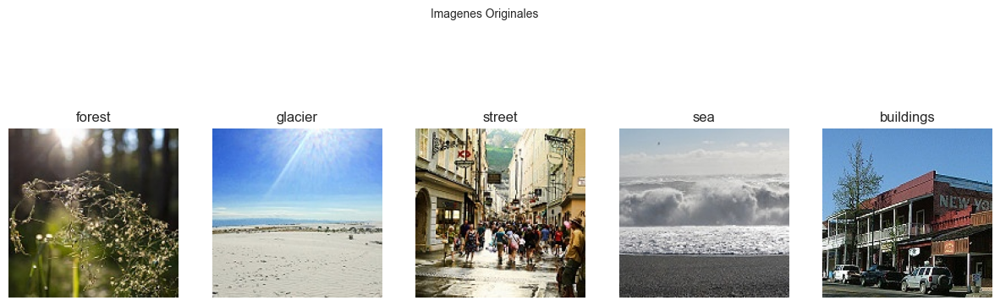

In [58]:
def mostrar_imagenes(muestras, titulo='Imagenes Originales'):
    plt.figure(figsize=(15,5))

    for i, clase_nombre in enumerate(muestras):
        clase_folder = os.path.join(ruta_imagenes, clase_nombre)

        if os.path.exists(clase_folder):
            imagenes_en_clase = os.listdir(clase_folder)

            if imagenes_en_clase:
                imagen_nombre = random.choice(imagenes_en_clase)
                img_path = os.path.join(clase_folder, imagen_nombre)
                img = cv2.imread(img_path)

                if img is not None:
                    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
                    plt.subplot(1, len(muestras), i+1)
                    plt.imshow(img)
                    plt.axis('off')
                    plt.title(f'{clase_nombre}')
                else:
                    print(f'Error al cargar imagen: {img_path}')
            else:
                print(f'No existen imagenes en la carpeta: {clase_folder}')
        else:
            print(f'No existe la carpeta: {clase_folder}')

    plt.suptitle(titulo, fontsize=10)
    plt.show()

mostrar_imagenes(muestras)

# Vamos a resaltar contornos y formas dominantes

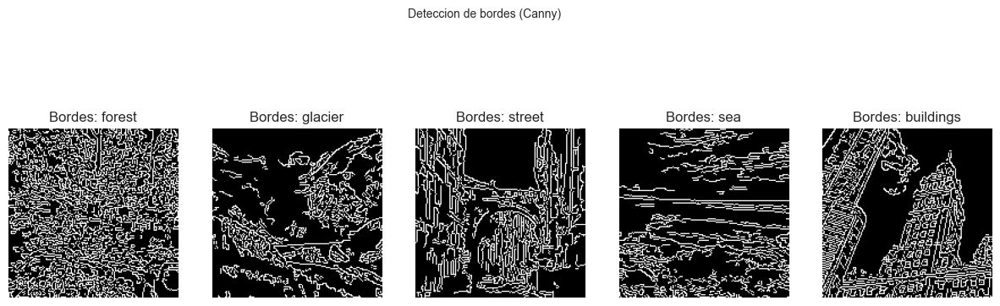

In [65]:
def mostrar_bordes(muestras):
    plt.figure(figsize=(15,5))

    for i, clase_nombre in enumerate(muestras):
        clase_folder = os.path.join(ruta_imagenes, clase_nombre)

        if os.path.exists(clase_folder):
            imagenes_clase = os.listdir(clase_folder)

            if imagenes_clase:
                imagen_nombre = random.choice(imagenes_clase)
                img_path = os.path.join(clase_folder, imagen_nombre)
                img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)

                if img is not None:
                    bordes = cv2.Canny(img, 100, 200)
                    plt.subplot(1, len(muestras), i+1)
                    plt.imshow(bordes, cmap='gray')
                    plt.axis('off')
                    plt.title(f'Bordes: {clase_nombre}')
                else:
                    print(f'No existen imagenes en la carpeta: {img_path}')
            else:
                print(f'No existen imagenes en la carpeta: {clase_folder}')
        else:
            print(f'No existe la carpeta: {clase_folder}')

    plt.suptitle('Deteccion de bordes (Canny)', fontsize=10)
    plt.show()

mostrar_bordes(muestras)

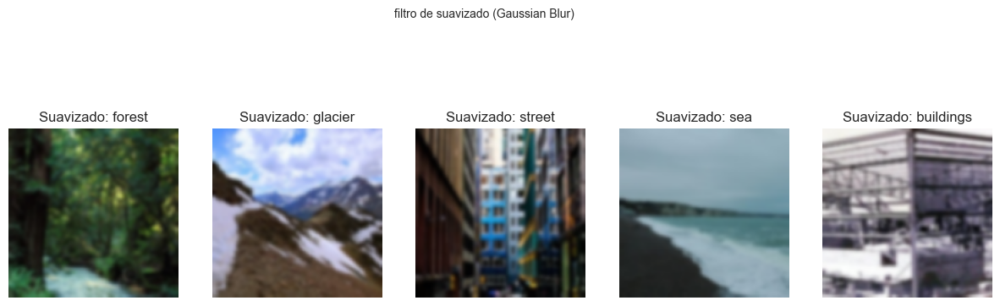

In [64]:
def filtro_suavizado(muestras):
    plt.figure(figsize=(15,5))

    for i, clase_nombre in enumerate(muestras):
        clase_folder = os.path.join(ruta_imagenes, clase_nombre)

        if os.path.exists(clase_folder):
            imagenes_clase = os.listdir(clase_folder)

            if imagenes_clase:
                imagen_nombre = random.choice(imagenes_clase)
                img_path = os.path.join(clase_folder, imagen_nombre)
                img = cv2.imread(img_path)

                if img is not None:
                    rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
                    suavizado = cv2.GaussianBlur(rgb, (9, 9), 0)
                    plt.subplot(1, len(muestras), i+1)
                    plt.imshow(suavizado)
                    plt.axis('off')
                    plt.title(f'Suavizado: {clase_nombre}')
                else:
                    print(f'No existen imagenes en la carpeta: {img_path}')
            else:
                print(f'No existen imagenes en la carpeta: {clase_folder}')
        else:
            print(f'No existe la carpeta: {clase_folder}')

    plt.suptitle('filtro de suavizado (Gaussian Blur)', fontsize=10)
    plt.show()

filtro_suavizado(muestras)

# Histograms de RGB para mostrar la distribución de colore. útil para entender clases diminantes para ciertos tonos

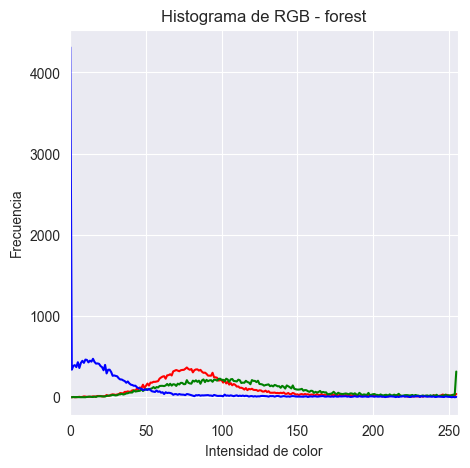

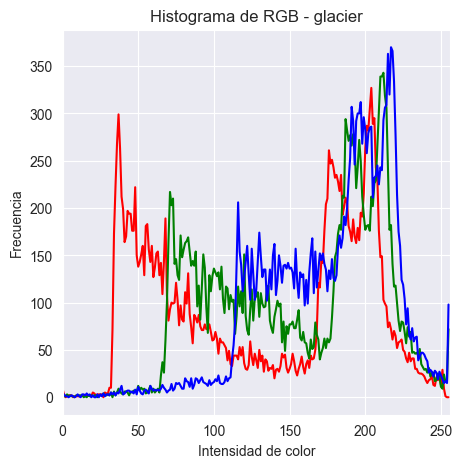

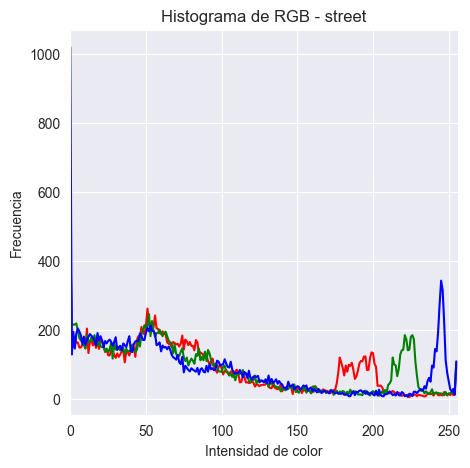

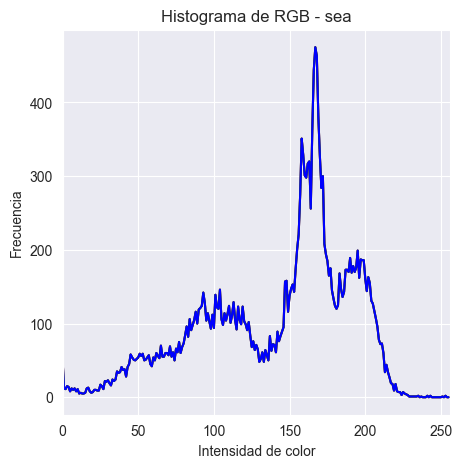

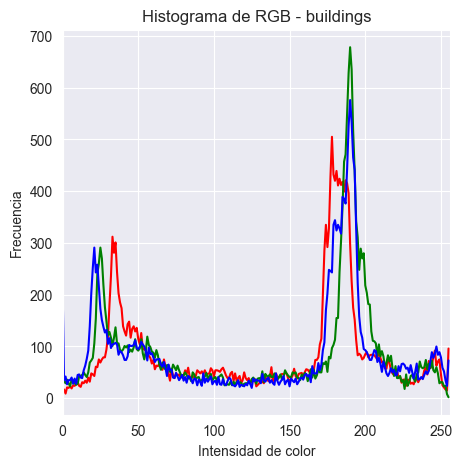

In [70]:
def histograma_rgb(muestras):
    for nombre in muestras:
        clase_folder = os.path.join(ruta_imagenes, nombre)

        if os.path.exists(clase_folder):
            img_clases = os.listdir(clase_folder)

            if img_clases:
                img_nombre = random.choice(img_clases)
                img_path = os.path.join(clase_folder, img_nombre)
                img = cv2.imread(img_path)

                if img is not None:
                    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
                    plt.figure(figsize=(5,5))
                    colores = ('r', 'g', 'b')

                    for i, color in enumerate(colores):
                        hist = cv2.calcHist([img_rgb], [i], None, [256], [0, 256])
                        plt.plot(hist, color=color)
                    plt.title(f'Histograma de RGB - {nombre}')
                    plt.xlabel('Intensidad de color')
                    plt.ylabel('Frecuencia')
                    plt.xlim([0, 256])
                    #plt.grid(True)
                    plt.show()
                else:
                    print(f'Error al cargar imagen {img_path}')
            else:
                print(f'No existen imagenes en la carpeta {clase_folder}')
        else:
            print(f'No existe la carpeta {clase_folder}')


histograma_rgb(muestras)

# Vamos a mostrar una imágen por cada clase original y al mismo tiempo la distribución de canales RGB

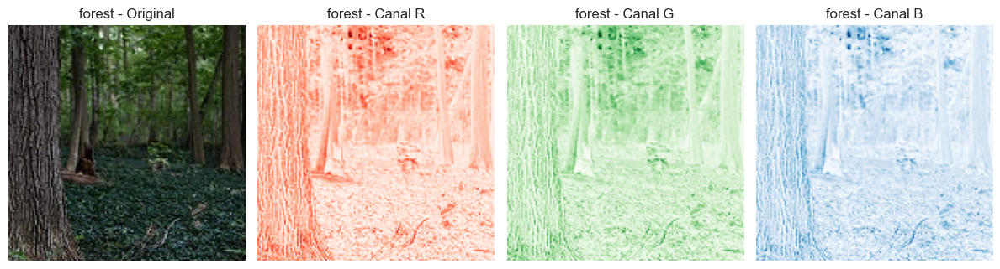

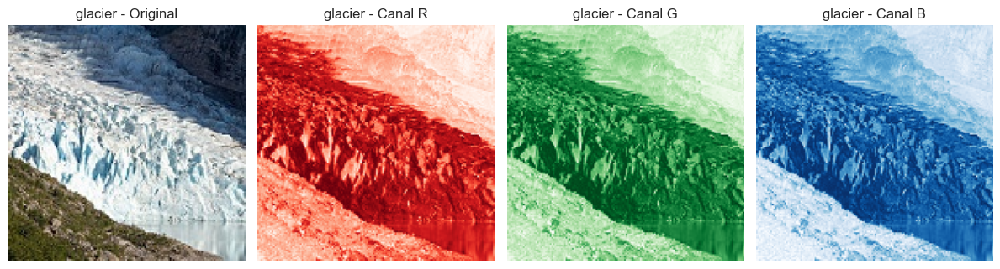

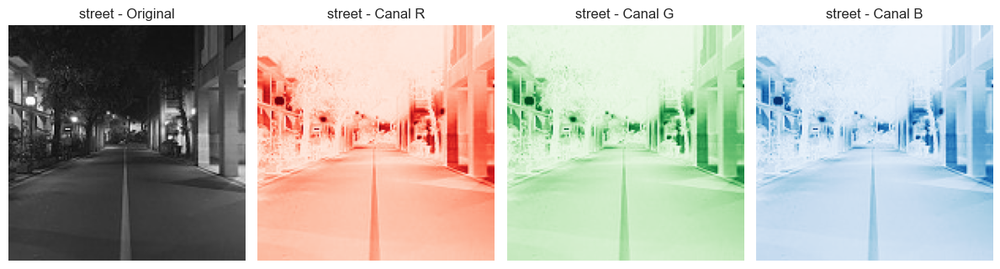

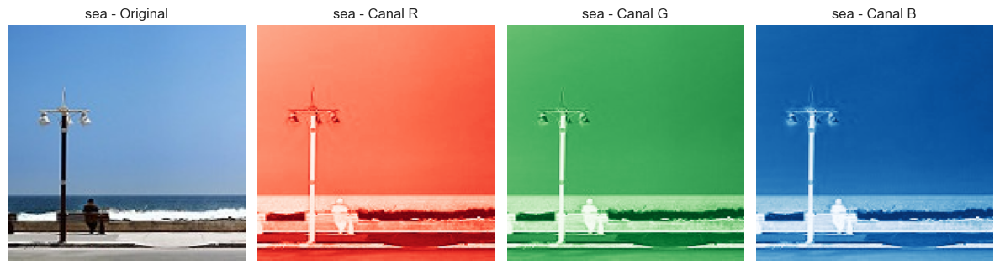

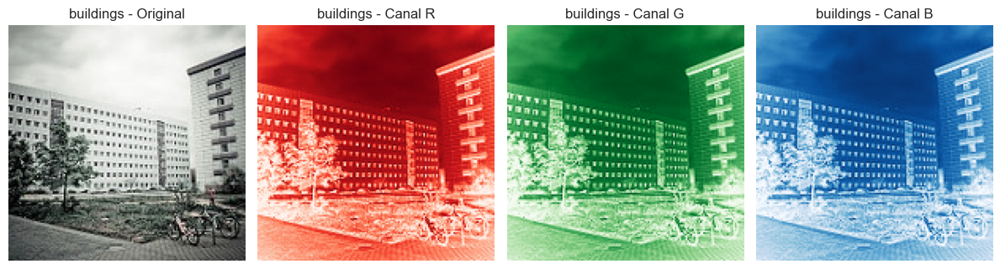

In [76]:
def mostrar_canales_rgb(muestras):
    for nombre_clase in muestras:
        clase_folder = os.path.join(ruta_imagenes, nombre_clase)

        if os.path.exists(clase_folder):
            imagenes_en_clase = os.listdir(clase_folder)

            if imagenes_en_clase:
                imagen_nombre = random.choice(imagenes_en_clase)
                ruta_imagen = os.path.join(clase_folder, imagen_nombre)
                imagen = cv2.imread(ruta_imagen)

                if imagen is not None:
                    imagen_rgb = cv2.cvtColor(imagen, cv2.COLOR_BGR2RGB)


                    R, G, B = cv2.split(imagen_rgb)

                    plt.figure(figsize=(12, 6))

                    plt.subplot(1, 4, 1)
                    plt.imshow(imagen_rgb)
                    plt.title(f"{nombre_clase} - Original")
                    plt.axis('off')

                    plt.subplot(1, 4, 2)
                    plt.imshow(R, cmap='Reds')
                    plt.title(f"{nombre_clase} - Canal R")
                    plt.axis('off')

                    plt.subplot(1, 4, 3)
                    plt.imshow(G, cmap='Greens')
                    plt.title(f"{nombre_clase} - Canal G")
                    plt.axis('off')

                    plt.subplot(1, 4, 4)
                    plt.imshow(B, cmap='Blues')
                    plt.title(f"{nombre_clase} - Canal B")
                    plt.axis('off')

                    plt.tight_layout()
                    plt.show()
                else:
                    print(f"Error al cargar imagen: {ruta_imagen}")
            else:
                print(f"No existen imagenes en esta carpeta: {clase_folder}")
        else:
            print(f"No existe la carpeta: {clase_folder}")



mostrar_canales_rgb(muestras)

# Procesamiento de datos
- Vamos a pasar al procesamiento de los datos, para entrenar nuestra red neuronal, nuestras capas, pero en este caso vamos a reducir un poco el tamaño del dataset para que no dure tanto el procesamiento.
- Vamos a usar ImageDataGenerator que es una clase de Keras que automatiza la carga y transformación de imágenes desde carpetas. Esto nos es util en este dataset que ya viene organizada por carpetas.

# Vamos a crear los generadores de imágenes
- Uno para entrenamiento
- otro para validación

## Parámetros importantes
- rescale: Normaliza los píxeles de 0-255 a 0-1
- rotation: Rota aleatoriamente las imágenes hasta 20 grados
- width_shift_range: Desplaza horizontalmente las imágenes
- height_shift_range: Desplaza verticalmente las imágenes
- shear_range: Aplica transformaciones de corte
- zoom_range: aplica zoom aleatorio
- horizontal_flip: invierte horizontalmente la imágen
- fill_mode: Rellena los pixeles faltantes tras la transformación
- validation_spli: Separa el 20% de los datos para validación


In [6]:
nuevo_data_path = 'G:/Intel/data_train'
nuevo_data_test = 'G:/Intel/data_test'
nuevo_data_pred = 'G:/Intel/data_pred'

In [7]:
train_datagen1 = ImageDataGenerator(
    rescale = 1./255,
    rotation_range = 45,
    width_shift_range = 0.2,
    height_shift_range = 0.2,
    shear_range = 0.2,
    zoom_range = 0.2,
    horizontal_flip = True,
    fill_mode = 'nearest',
    validation_split = 0.2,
)

In [8]:
val_datagen1 = ImageDataGenerator(
    rescale = 1./255,
    validation_split = 0.2,
)

# Creación de los conjuntos (train y val)
- flow_from_factory: Busca sub-carpetas en data_train y cada una representa una clase
- class_mode: 'categorical':Es por qur hay mas de dos clases
- shuffle_True: Mezcla aleatoriamente las imágenes en el entrenamiento para que el modelo no aprenda en un orden espcifico

In [9]:
image_size = (150, 150)
batch_size = 32

train_generator1 = train_datagen1.flow_from_directory(
    nuevo_data_path,
    target_size = image_size,
    batch_size = batch_size,
    class_mode = 'categorical',
    subset = 'training',
    shuffle = True,
    seed=42
)

Found 4800 images belonging to 6 classes.


In [10]:
val_generator1 = val_datagen1.flow_from_directory(
    nuevo_data_test,
    target_size = image_size,
    batch_size = batch_size,
    class_mode='categorical',
    subset='validation',
    shuffle=False,
    seed=42
)

Found 598 images belonging to 6 classes.


In [11]:
print('Clases detectadas:', train_generator1.class_indices)

Clases detectadas: {'buildings': 0, 'forest': 1, 'glacier': 2, 'mountain': 3, 'sea': 4, 'street': 5}


# Construcción y entrenamiento del modelo CNN
## Parámetros
- Conv2D: Extrae características visuales (bordes, texturas).
- MaxPooling2D: reduce el tamaño y la complejidad de las características.
- Flatten: Convierte el mapa 2D de activaciones en un vector 1D.
- Dense: Decide la clasificación a partir de las características.
- Dropout: Ayuda a que el modelo no memorice los datos.
- softmax: Para clasificación multiclase.

In [17]:
modelo1 = Sequential()

# Capas convolucionales
## Por que usamos 3 capas en este entrenamiento:
- Usamos 3 capas porque nuestra red es media o mediana.
- Tenemos una resolución baja/mediana en las imágenes que para nuestro caso son de 150*150
- El Dataset que estamos ocupando no estan grande
- Porque tambien no tenemos una GPU y hacemos uso solo de CPU

# Características de las capas
- 1ra capa: borde, límites
- 2da capa: formas, texturas
- 3ra capa: patrones más abstractos

# Filtros (32 -> 64 -> 128)
- La primera capa detecta los detalles pequeños
- La segunda capa que es la intermedia aprende combinaciones de los detalles
- La última capa necesita representar patrones mas complejos, esto aumenta la capacidad de representación del modelo.

# Podemos agregar más capas
Podemos agregar más capas hasta llegar a un filtro del tamaño 256. Estos es incluir 4-5-6 o mas, dependiendo de factores como:
- El tamaño del Dataset, entre mas grande redes mas profundas
- Tamaño de las imágenes, mas grandes mas capas posibles
- Capacidad de procesamiento, es decir más capas, más parámetros más uso de GPU

In [18]:
modelo1.add(Conv2D(32, (3,3), activation='relu', input_shape=(150, 150, 3)))
modelo1.add(MaxPooling2D(pool_size=(2,2)))

modelo1.add(Conv2D(64, (3,3), activation='relu'))
modelo1.add(MaxPooling2D(pool_size=(2,2)))

modelo1.add(Conv2D(128, (3,3), activation='relu'))
modelo1.add(MaxPooling2D(pool_size=(2,2)))


# Aplanamos la salida para conectarla a capas densas.

In [19]:
modelo1.add(Flatten())

# Capa totalmente conectada

In [20]:
modelo1.add(Dense(128, activation='relu'))
modelo1.add(Dropout(0.5))

# Capa de salida

In [21]:
modelo1.add(Dense(train_generator1.num_classes, activation='softmax'))

# Compilación del modelo
- Adam: Optimizador eficiente que ajusta los pesos
- categorical_crossentropy: función de pérdida adecuada cuando usamos class_mode='categorical'

In [22]:
modelo1.compile(
    optimizer=Adam(learning_rate=0.001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

# Resumen del modelo

In [23]:
modelo1.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_7 (Conv2D)           (None, 148, 148, 32)      896       
                                                                 
 max_pooling2d_5 (MaxPoolin  (None, 74, 74, 32)        0         
 g2D)                                                            
                                                                 
 conv2d_8 (Conv2D)           (None, 72, 72, 64)        18496     
                                                                 
 max_pooling2d_6 (MaxPoolin  (None, 36, 36, 64)        0         
 g2D)                                                            
                                                                 
 conv2d_9 (Conv2D)           (None, 34, 34, 128)       73856     
                                                                 
 max_pooling2d_7 (MaxPoolin  (None, 17, 17, 128)      

# Resumen
- Total de parámetros 4,829,126
- Entrenables 4,829,126
- No entrenables 0
Esto nos quiere decir que la red tiene mas de 4.8 millosnes de pesos que ira ajustando con el entrenamiento. ya que nuestro modelo es de tamaño medio.

In [25]:
epochs1 = 10

modelo_entrenado1 = modelo1.fit(
    train_generator1,
    epochs=epochs1,
    validation_data=val_generator1
    #validation_step=val_generator.samples
)

Epoch 1/10
150/150 [==============================] - 273s 2s/step - loss: 1.4088 - accuracy: 0.4087 - val_loss: 1.1851 - val_accuracy: 0.5368
Epoch 2/10
150/150 [==============================] - 125s 830ms/step - loss: 1.1973 - accuracy: 0.5331 - val_loss: 1.0145 - val_accuracy: 0.6154
Epoch 3/10
150/150 [==============================] - 119s 789ms/step - loss: 1.1028 - accuracy: 0.5731 - val_loss: 1.0259 - val_accuracy: 0.6455
Epoch 4/10
150/150 [==============================] - 118s 787ms/step - loss: 1.0888 - accuracy: 0.5863 - val_loss: 0.9696 - val_accuracy: 0.6371
Epoch 5/10
150/150 [==============================] - 119s 794ms/step - loss: 1.0673 - accuracy: 0.5967 - val_loss: 0.9002 - val_accuracy: 0.6639
Epoch 6/10
150/150 [==============================] - 121s 802ms/step - loss: 0.9979 - accuracy: 0.6229 - val_loss: 0.8908 - val_accuracy: 0.6722
Epoch 7/10
150/150 [==============================] - 119s 789ms/step - loss: 0.9765 - accuracy: 0.6329 - val_loss: 0.8985 - va

In [26]:
history_dict1 = modelo_entrenado1.history

In [27]:
modelo_entrenado1.history

{'loss': [1.4088014364242554,
  1.197329044342041,
  1.1027708053588867,
  1.088754653930664,
  1.0673149824142456,
  0.9978610277175903,
  0.9765427708625793,
  0.9781989455223083,
  0.9400767087936401,
  0.9054098725318909],
 'accuracy': [0.4087499976158142,
  0.5331249833106995,
  0.5731250047683716,
  0.5862500071525574,
  0.596666693687439,
  0.6229166388511658,
  0.6329166889190674,
  0.6362500190734863,
  0.6477083563804626,
  0.6614583134651184],
 'val_loss': [1.1850954294204712,
  1.0144895315170288,
  1.0258711576461792,
  0.9696007966995239,
  0.9001606702804565,
  0.89079350233078,
  0.898517906665802,
  0.8213281631469727,
  0.8296622633934021,
  0.7597572803497314],
 'val_accuracy': [0.5367892980575562,
  0.6153846383094788,
  0.6454849243164062,
  0.6371237635612488,
  0.6638795733451843,
  0.6722407937049866,
  0.6688963174819946,
  0.7107023596763611,
  0.7207357883453369,
  0.7558528184890747]}

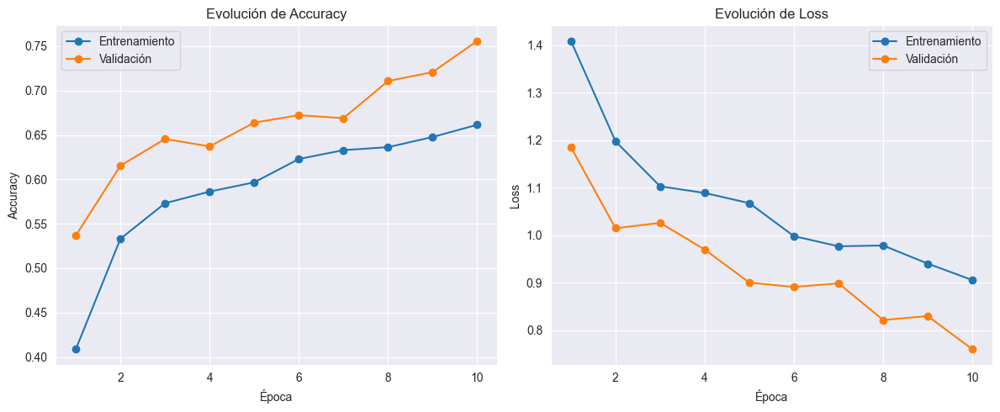

In [28]:
history_dict1 = modelo_entrenado1.history
epochs = range(1, len(history_dict1['accuracy']) + 1)

# Accuracy
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(epochs, history_dict1['accuracy'], 'o-', label='Entrenamiento')
plt.plot(epochs, history_dict1['val_accuracy'], 'o-', label='Validación')
plt.title('Evolución de Accuracy')
plt.xlabel('Época')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)

# Loss
plt.subplot(1, 2, 2)
plt.plot(epochs, history_dict1['loss'], 'o-', label='Entrenamiento')
plt.plot(epochs, history_dict1['val_loss'], 'o-', label='Validación')
plt.title('Evolución de Loss')
plt.xlabel('Época')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

# Segundo entrenamiento

In [9]:
data_train = 'G:/Intel/seg_train'
data_test = 'G:/Intel/seg_test'
data_path = 'G:/Intel/seg_train'

In [10]:
train_datagen2 = ImageDataGenerator(
    rescale = 1./255,
    rotation_range = 45,
    width_shift_range = 0.2,
    height_shift_range = 0.2,
    shear_range = 0.2,
    zoom_range = 0.2,
    horizontal_flip = True,
    fill_mode = 'nearest',
    validation_split = 0.2,
)

In [11]:
val_datagen2 = ImageDataGenerator(
    rescale = 1./255,
    validation_split = 0.2,
)

In [32]:
image_size = (150, 150)
batch_size = 32

train_generator2 = train_datagen2.flow_from_directory(
    data_train,
    target_size = image_size,
    batch_size = batch_size,
    class_mode = 'categorical',
    subset = 'training',
    shuffle = True,
    seed=42
)

Found 11230 images belonging to 6 classes.


In [33]:
val_generator2 = val_datagen2.flow_from_directory(
    data_test,
    target_size = image_size,
    batch_size = batch_size,
    class_mode='categorical',
    subset='validation',
    shuffle=False,
    seed=42
)

Found 598 images belonging to 6 classes.


In [34]:
print('Clases detectadas:', train_generator2.class_indices)

Clases detectadas: {'buildings': 0, 'forest': 1, 'glacier': 2, 'mountain': 3, 'sea': 4, 'street': 5}


In [35]:
modelo2 = Sequential()

In [36]:
modelo2.add(Conv2D(32, (3,3), activation='relu', input_shape=(150, 150, 3)))
modelo2.add(MaxPooling2D(pool_size=(2,2)))

modelo2.add(Conv2D(64, (3,3), activation='relu'))
modelo2.add(MaxPooling2D(pool_size=(2,2)))

modelo2.add(Conv2D(128, (3,3), activation='relu'))
modelo2.add(MaxPooling2D(pool_size=(2,2)))

In [37]:
modelo2.add(Flatten())

In [38]:
modelo2.add(Dense(128, activation='relu'))
modelo2.add(Dropout(0.5))

In [39]:
modelo2.add(Dense(train_generator2.num_classes, activation='softmax'))

In [40]:
modelo2.compile(
    optimizer=Adam(learning_rate=0.001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

In [41]:
modelo2.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_10 (Conv2D)          (None, 148, 148, 32)      896       
                                                                 
 max_pooling2d_8 (MaxPoolin  (None, 74, 74, 32)        0         
 g2D)                                                            
                                                                 
 conv2d_11 (Conv2D)          (None, 72, 72, 64)        18496     
                                                                 
 max_pooling2d_9 (MaxPoolin  (None, 36, 36, 64)        0         
 g2D)                                                            
                                                                 
 conv2d_12 (Conv2D)          (None, 34, 34, 128)       73856     
                                                                 
 max_pooling2d_10 (MaxPooli  (None, 17, 17, 128)      

In [42]:
epochs2 = 20

modelo_entrenado2 = modelo2.fit(
    train_generator2,
    epochs=epochs2,
    validation_data=val_generator2
    #validation_step=val_generator.samples
)

Epoch 1/20
351/351 [==============================] - 660s 2s/step - loss: 1.2980 - accuracy: 0.4805 - val_loss: 1.0673 - val_accuracy: 0.5619
Epoch 2/20
351/351 [==============================] - 284s 807ms/step - loss: 1.1033 - accuracy: 0.5738 - val_loss: 1.1376 - val_accuracy: 0.6087
Epoch 3/20
351/351 [==============================] - 281s 800ms/step - loss: 1.0035 - accuracy: 0.6195 - val_loss: 0.8541 - val_accuracy: 0.7007
Epoch 4/20
351/351 [==============================] - 282s 802ms/step - loss: 0.9385 - accuracy: 0.6508 - val_loss: 0.8968 - val_accuracy: 0.6957
Epoch 5/20
351/351 [==============================] - 281s 801ms/step - loss: 0.9043 - accuracy: 0.6613 - val_loss: 0.7504 - val_accuracy: 0.7324
Epoch 6/20
351/351 [==============================] - 283s 806ms/step - loss: 0.8596 - accuracy: 0.6889 - val_loss: 0.7220 - val_accuracy: 0.7425
Epoch 7/20
351/351 [==============================] - 282s 802ms/step - loss: 0.8267 - accuracy: 0.7028 - val_loss: 0.6980 - va

In [43]:
history_dict2 = modelo_entrenado2.history

In [44]:
modelo_entrenado2.history.keys()

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])

In [45]:
modelo_entrenado2.history


{'loss': [1.2980388402938843,
  1.1033177375793457,
  1.0035395622253418,
  0.9384883642196655,
  0.9043436646461487,
  0.859642505645752,
  0.8266555666923523,
  0.78504478931427,
  0.7720282077789307,
  0.7519802451133728,
  0.7352477312088013,
  0.7201619148254395,
  0.7067561745643616,
  0.6906139254570007,
  0.6779631972312927,
  0.6672425270080566,
  0.6728276014328003,
  0.6491921544075012,
  0.6421696543693542,
  0.6292039752006531],
 'accuracy': [0.48049867153167725,
  0.5738201141357422,
  0.6195013523101807,
  0.6508459448814392,
  0.6612644791603088,
  0.6888691186904907,
  0.7027604579925537,
  0.7178984880447388,
  0.7183437347412109,
  0.7301869988441467,
  0.7382012605667114,
  0.7412288784980774,
  0.7475512027740479,
  0.7530721426010132,
  0.7608192563056946,
  0.7607302069664001,
  0.7639358639717102,
  0.7685663104057312,
  0.7710596323013306,
  0.7739091515541077],
 'val_loss': [1.0672651529312134,
  1.137558937072754,
  0.8541373610496521,
  0.8967649340629578,
 

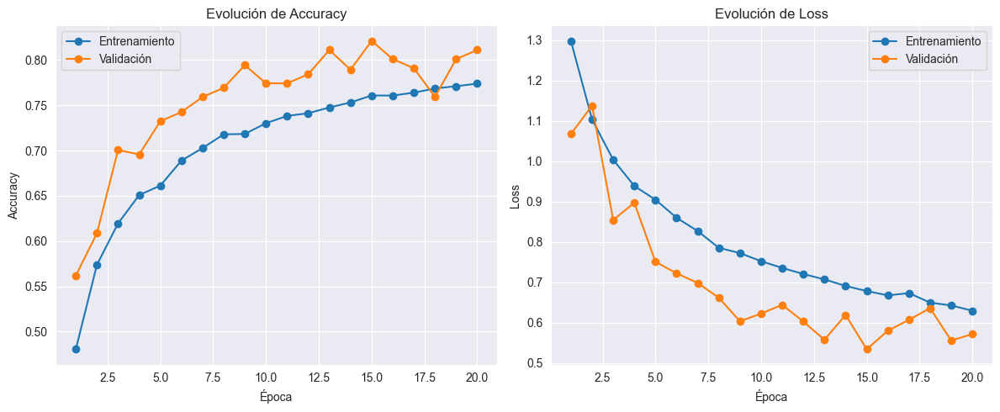

In [65]:
history_dict2 = modelo_entrenado2.history
epochs2 = range(1, len(history_dict2['accuracy']) + 1)

# Accuracy
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(epochs2, history_dict2['accuracy'], 'o-', label='Entrenamiento')
plt.plot(epochs2, history_dict2['val_accuracy'], 'o-', label='Validación')
plt.title('Evolución de Accuracy')
plt.xlabel('Época')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)

# Loss
plt.subplot(1, 2, 2)
plt.plot(epochs2, history_dict2['loss'], 'o-', label='Entrenamiento')
plt.plot(epochs2, history_dict2['val_loss'], 'o-', label='Validación')
plt.title('Evolución de Loss')
plt.xlabel('Época')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

# Tercer entranamiento:

In [12]:
data_train = 'G:/Intel/seg_train'
data_test = 'G:/Intel/seg_test'
data_path = 'G:/Intel/seg_train'

In [26]:
train_datagen3 = ImageDataGenerator(
    rescale = 1./255,
    rotation_range = 25,
    width_shift_range = 0.2,
    height_shift_range = 0.2,
    shear_range = 0.15,
    zoom_range = 0.2,
    horizontal_flip = True,
    fill_mode = 'nearest',
    validation_split = 0.2
)

In [27]:
val_datagen3 = ImageDataGenerator(
    rescale = 1./255
)

In [28]:
image_size = (150, 150)
batch_size = 32

train_generator3 = train_datagen3.flow_from_directory(
    data_train,
    target_size = image_size,
    batch_size = batch_size,
    class_mode = 'categorical'
)

Found 14034 images belonging to 6 classes.


In [29]:
val_generator3 = val_datagen3.flow_from_directory(
    data_test,
    target_size = image_size,
    batch_size = batch_size,
    class_mode='categorical'
)

Found 3000 images belonging to 6 classes.


In [31]:
modelo3 = Sequential([
    Conv2D(32, (3,3), activation='relu', input_shape=(150, 150, 3)),
    MaxPooling2D(pool_size=(2,2)),

    Conv2D(64, (3,3), activation='relu'),
    MaxPooling2D(pool_size=(2,2)),

    Conv2D(128, (3,3), activation='relu'),
    MaxPooling2D(pool_size=(2,2)),

    Flatten(),
    Dense(128, activation='relu'),
    Dropout(0.5),
    Dense(train_generator3.num_classes, activation='softmax')
])

In [32]:
modelo3.compile(
    optimizer=Adam(learning_rate=0.001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

In [33]:
early_stop = EarlyStopping(
    monitor='val_loss',
    patience=5,
    restore_best_weights=True
)

In [34]:
reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=3,
    min_lr=1e-6
)

In [36]:
epochs3 = 30

modelo_entrenado3 = modelo3.fit(
    train_generator3,
    epochs=epochs3,
    validation_data=val_generator3,
    callbacks=[early_stop, reduce_lr]
)

Epoch 1/30
439/439 [==============================] - 1062s 2s/step - loss: 1.1994 - accuracy: 0.5202 - val_loss: 0.9189 - val_accuracy: 0.6377 - lr: 0.0010
Epoch 2/30
439/439 [==============================] - 518s 1s/step - loss: 1.0056 - accuracy: 0.6162 - val_loss: 0.8245 - val_accuracy: 0.6863 - lr: 0.0010
Epoch 3/30
439/439 [==============================] - 459s 1s/step - loss: 0.8840 - accuracy: 0.6719 - val_loss: 0.6798 - val_accuracy: 0.7593 - lr: 0.0010
Epoch 4/30
439/439 [==============================] - 466s 1s/step - loss: 0.8010 - accuracy: 0.7028 - val_loss: 0.7166 - val_accuracy: 0.7433 - lr: 0.0010
Epoch 5/30
439/439 [==============================] - 484s 1s/step - loss: 0.7538 - accuracy: 0.7288 - val_loss: 0.5603 - val_accuracy: 0.8070 - lr: 0.0010
Epoch 6/30
439/439 [==============================] - 459s 1s/step - loss: 0.7139 - accuracy: 0.7441 - val_loss: 0.5447 - val_accuracy: 0.7987 - lr: 0.0010
Epoch 7/30
439/439 [==============================] - 460s 1s/s

In [38]:
history_dict3 = modelo_entrenado3.history

In [39]:
modelo_entrenado3.history.keys()

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy', 'lr'])

In [40]:
modelo_entrenado3.history

{'loss': [1.1994311809539795,
  1.0056487321853638,
  0.8840314149856567,
  0.8009738922119141,
  0.753781259059906,
  0.7139289379119873,
  0.689836323261261,
  0.6565174460411072,
  0.6540573835372925,
  0.5838224291801453,
  0.5599307417869568,
  0.5576876997947693,
  0.5398508906364441,
  0.5081998109817505,
  0.4955448508262634,
  0.4951328933238983,
  0.4842793643474579,
  0.4923228919506073,
  0.4662681221961975,
  0.45923635363578796,
  0.459299772977829,
  0.44129329919815063,
  0.44251206517219543,
  0.44209861755371094,
  0.4400606155395508,
  0.4381740689277649,
  0.4310492277145386,
  0.4289337992668152,
  0.42584457993507385,
  0.4291658103466034],
 'accuracy': [0.5202365517616272,
  0.6162177324295044,
  0.6718683242797852,
  0.7027932405471802,
  0.7288014888763428,
  0.7441214323043823,
  0.7543109655380249,
  0.7702721953392029,
  0.7685620784759521,
  0.7908650636672974,
  0.7969930171966553,
  0.8029072284698486,
  0.8104603290557861,
  0.8212199211120605,
  0.82699

In [44]:
modelo_final = modelo_entrenado3

# Guardamos y el modleo para poder despues poder reutilizarlo.

In [52]:
modelo3.save("modelo_entrenado3.keras")

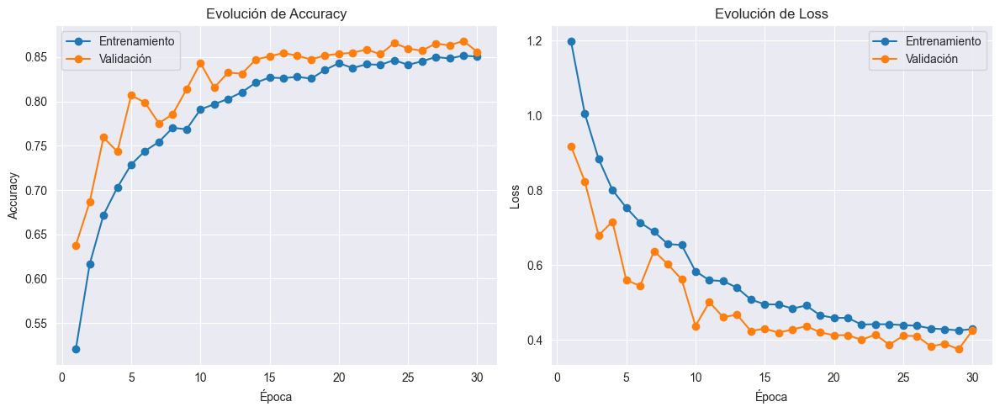

In [53]:
history_dict3 = modelo_entrenado3.history
epochs3 = range(1, len(history_dict3['accuracy']) + 1)

# Accuracy
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(epochs3, history_dict3['accuracy'], 'o-', label='Entrenamiento')
plt.plot(epochs3, history_dict3['val_accuracy'], 'o-', label='Validación')
plt.title('Evolución de Accuracy')
plt.xlabel('Época')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)

# Loss
plt.subplot(1, 2, 2)
plt.plot(epochs3, history_dict3['loss'], 'o-', label='Entrenamiento')
plt.plot(epochs3, history_dict3['val_loss'], 'o-', label='Validación')
plt.title('Evolución de Loss')
plt.xlabel('Época')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

# Comparativa de los 3 entrenamietnos junto accuracy y loss

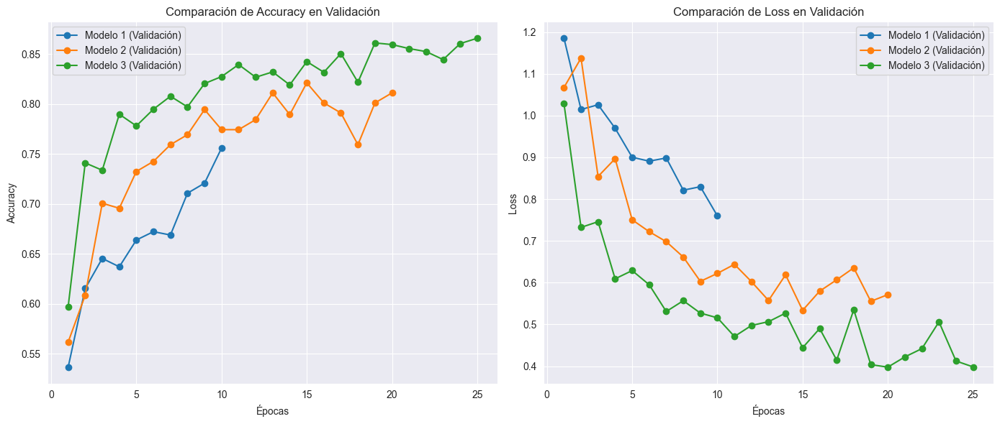

In [66]:
epochs = range(1, len(history_dict1['accuracy']) + 1)
epochs2 = range(1, len(history_dict2['accuracy']) + 1)
epochs3 = range(1, len(history_dict3['accuracy']) + 1)

plt.figure(figsize=(14, 6))


plt.subplot(1, 2, 1)
plt.plot(epochs, history_dict1['val_accuracy'], 'o-', label='Modelo 1 (Validación)')
plt.plot(epochs2, history_dict2['val_accuracy'], 'o-', label='Modelo 2 (Validación)')
plt.plot(epochs3, history_dict3['val_accuracy'], 'o-', label='Modelo 3 (Validación)')
plt.title('Comparación de Accuracy en Validación')
plt.xlabel('Épocas')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)


plt.subplot(1, 2, 2)
plt.plot(epochs, history_dict1['val_loss'], 'o-', label='Modelo 1 (Validación)')
plt.plot(epochs2, history_dict2['val_loss'], 'o-', label='Modelo 2 (Validación)')
plt.plot(epochs3, history_dict3['val_loss'], 'o-', label='Modelo 3 (Validación)')
plt.title('Comparación de Loss en Validación')
plt.xlabel('Épocas')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

# Curvas de entrenamiento y validación

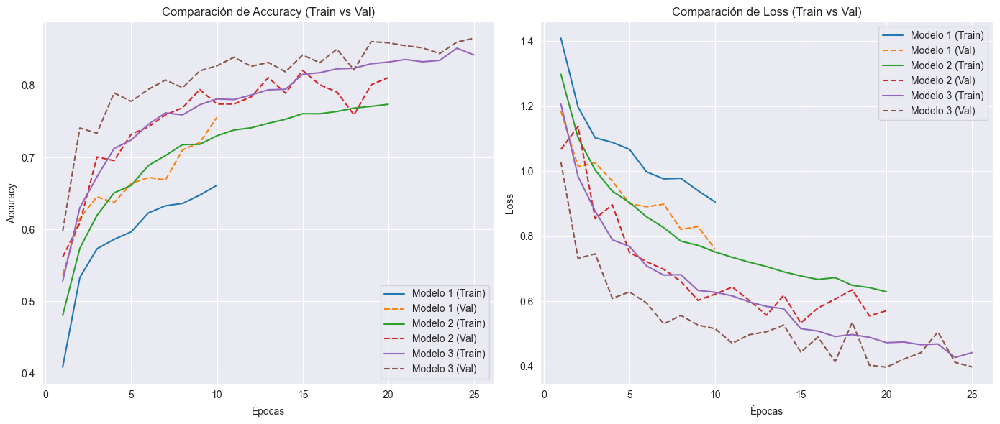

In [67]:
epochs = range(1, len(history_dict1['accuracy']) + 1)
epochs2 = range(1, len(history_dict2['accuracy']) + 1)
epochs3 = range(1, len(history_dict3['accuracy']) + 1)

plt.figure(figsize=(14, 6))


plt.subplot(1, 2, 1)
# Modelo 1
plt.plot(epochs, history_dict1['accuracy'], '-', label='Modelo 1 (Train)')
plt.plot(epochs, history_dict1['val_accuracy'], '--', label='Modelo 1 (Val)')
# Modelo 2
plt.plot(epochs2, history_dict2['accuracy'], '-', label='Modelo 2 (Train)')
plt.plot(epochs2, history_dict2['val_accuracy'], '--', label='Modelo 2 (Val)')
# Modelo 3
plt.plot(epochs3, history_dict3['accuracy'], '-', label='Modelo 3 (Train)')
plt.plot(epochs3, history_dict3['val_accuracy'], '--', label='Modelo 3 (Val)')

plt.title('Comparación de Accuracy (Train vs Val)')
plt.xlabel('Épocas')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)


plt.subplot(1, 2, 2)
# Modelo 1
plt.plot(epochs, history_dict1['loss'], '-', label='Modelo 1 (Train)')
plt.plot(epochs, history_dict1['val_loss'], '--', label='Modelo 1 (Val)')
# Modelo 2
plt.plot(epochs2, history_dict2['loss'], '-', label='Modelo 2 (Train)')
plt.plot(epochs2, history_dict2['val_loss'], '--', label='Modelo 2 (Val)')
# Modelo 3
plt.plot(epochs3, history_dict3['loss'], '-', label='Modelo 3 (Train)')
plt.plot(epochs3, history_dict3['val_loss'], '--', label='Modelo 3 (Val)')

plt.title('Comparación de Loss (Train vs Val)')
plt.xlabel('Épocas')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

# Comparación general de los entrenamientos.

| Modelo | Épocas | Accuracy final (train) | Val Accuracy final | Loss final (train) | Val loss (final) |
|--------|--------|------------------------|--------------------|--------------------|------------------|
| 1      | 10     | ~0.66                  | 0.75               | ~0.90              | 0.76             |
| 2      | 20     | ~0.77                  | 0.81               | ~0.63              | 0.57             |
| 3      | 25     | ~0.84                  | 0.86               | ~0.44              | 0.39             |


## Evaluación del rendimiento
- Entrenamiento 1:
    - Empezó con un accuracy bajo 0.40, pero subió rápido a 0.66 train y 0.75 val en solo 10 épocas.
    - Las curvas muestran que aun había margen para mejorar, pero el número de épocas fue limitado.
    - Se tiene buen resultado inicial, pero se quedó corto
- Entrenamiento 2:
    - Llegó a 0.77 train y 0.81 val en 20 épocas
    - La validación siguió mejorando sin señales claras de sobreajuste.
    - Muestra que más daos y más épocas mejoran notablemente el modelo
- Entrenamiento 3:
    - Se nota que fue el mejor por que alcanzo un 0.84 en train y 0.86 en val
    - Además, el val_loos bajó hasta 0.39, lo que indica que generaliza bien.
    - A partir de la época 20, el modelo ya tenia un rendimiento muy estable, con un ligero ajuste gracias a ReducelROnPlateau
    - La reducción del learning rate de 0.001 a 0.0005 a 0.00025 ayudó a pulir la convergencia.



-
- Podemos ver que cada entrenamiento supero al anterior en precision y estabilidad, ya que se fueron aumentado los datos, y las épocas.
- El modelo 3 no muestra un sobreajuste train y val accuracy estan muy cercanos 0.84 y 0.86
- En el modelo 3 despues de la época 20 no mejora mucho y ya no era necesario llegar hasta la apoca 30.
- Nos quedamos con el resultado del modelo 3, auqnue aun se le pueden hacer algunos ajustes para poder tener un accuaracy mas alto.

# Análisis de aciertos y errores


In [25]:
images_ = []
labels_ = []
for batch_images, batch_labels in val_generator3:
     images_.append(batch_images)
     labels_.append(batch_labels)
     if len(images_) * val_generator3.batch_size >= val_generator3.samples:
         break

images_ = np.vstack(images_)
labels_ = np.vstack(labels_)

In [26]:
#val_images, val_labels = next(iter(val_generator3))

predicciones = modelo3.predict(images_)
prediccion_clases = np.argmax(predicciones, axis=1)
clases_verdaderas =  np.argmax(labels_, axis=1)

correctos = np.where(prediccion_clases == clases_verdaderas)[0]
incorrectos = np.where(prediccion_clases != clases_verdaderas)[0]

clases = list(train_generator3.class_indices.keys())

94/94 [==============================] - 18s 186ms/step


In [33]:
def mostrar_datos(indices, titulo, n=9):
    plt.figure(figsize=(12, 12))

    if len(indices) > n:
        selected = random.sample(list(indices), n)
    else:
        selected = indices

    for i, idx in enumerate(selected):
        plt.subplot(3,3, i+1)
        plt.imshow(images_[idx])
        plt.axis('off')
        plt.title(f'Real: {clases[clases_verdaderas[idx]]}\n Pred: {clases[prediccion_clases[idx]]}')
    plt.suptitle(titulo, fontsize=16)
    plt.show()

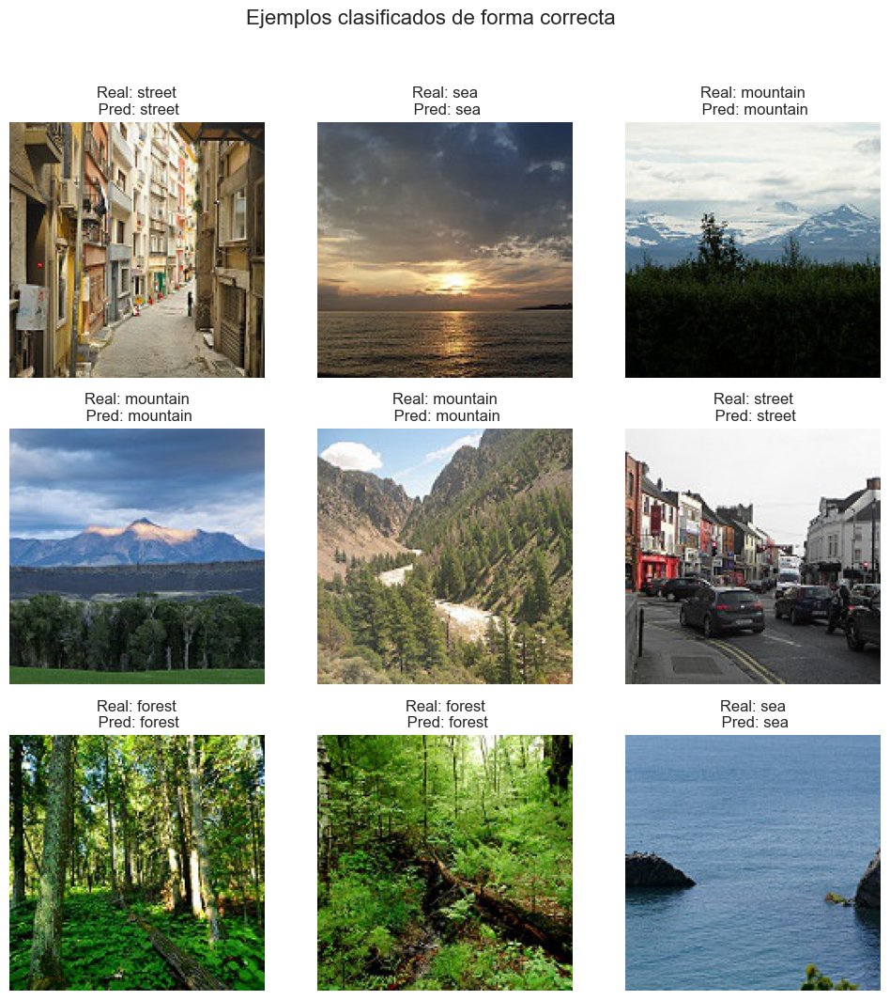

In [35]:
mostrar_datos(correctos, 'Ejemplos clasificados de forma correcta', n=9)

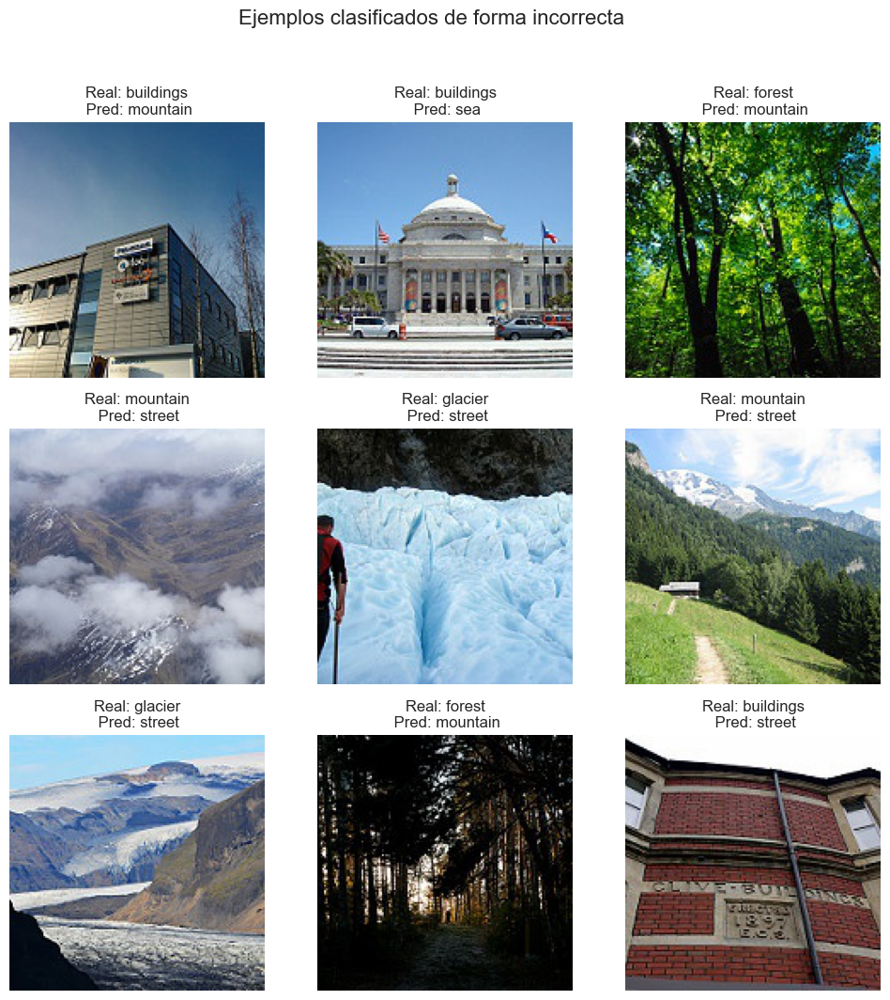

In [36]:
mostrar_datos(incorrectos, 'Ejemplos clasificados de forma incorrecta', n=9)

In [59]:
vl3 = val_generator3
tr3 = train_generator3
data_test = 'G:/Intel/seg_test'
seg_test = 'G:/Intel/seg_test'

In [60]:
test_datagen = ImageDataGenerator(rescale=1./255)

test_dir = 'G:/Intel/seg_test'
batch_size = 32
img_size = (150, 150)

test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=img_size,
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=False
)

modelo_final = modelo_entrenado3

Found 3000 images belonging to 6 classes.


# Evaluación global (loss y accuracy) + predicciones

In [63]:
test_loss, test_acc = modelo3.evaluate(test_generator, verbose=1)
print(f"Test Loss: {test_loss:.4f}")
print(f"Test Accuracy: {test_acc:.4f}")


y_prob = modelo3.predict(test_generator, verbose=1)


y_pred = np.argmax(y_prob, axis=1)


y_true = test_generator.classes


idx_to_class = {v: k for k, v in test_generator.class_indices.items()}
class_names = [idx_to_class[i] for i in range(len(idx_to_class))]

print("Clases (orden):", class_names)

94/94 [==============================] - 41s 428ms/step - loss: 0.4251 - accuracy: 0.8560
Test Loss: 0.4251
Test Accuracy: 0.8560
94/94 [==============================] - 23s 237ms/step
Clases (orden): ['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']


# Matriz e confusión (cruda y normalizada)

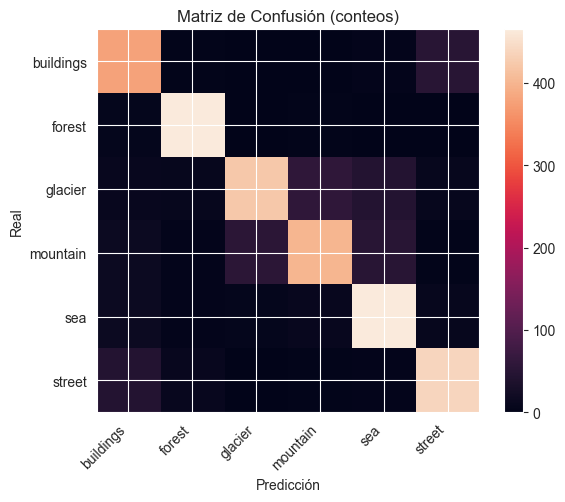

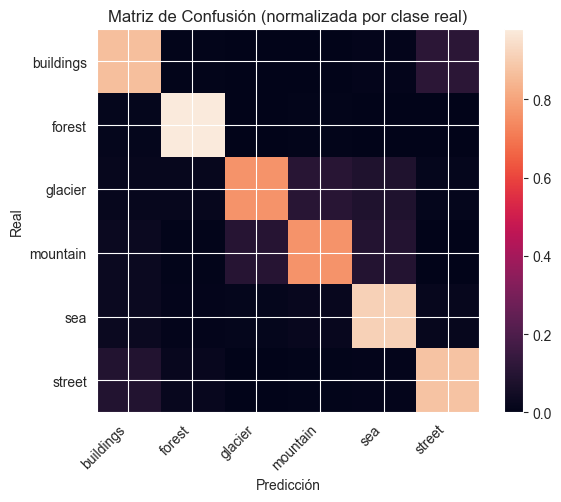

In [64]:
cm = confusion_matrix(y_true, y_pred)


cm_norm = cm.astype('float') / cm.sum(axis=1, keepdims=True)


plt.figure(figsize=(6, 5))
plt.imshow(cm, interpolation='nearest')
plt.title('Matriz de Confusión (conteos)')
plt.colorbar()
tick_marks = np.arange(len(class_names))
plt.xticks(tick_marks, class_names, rotation=45, ha='right')
plt.yticks(tick_marks, class_names)
plt.xlabel('Predicción')
plt.ylabel('Real')
plt.tight_layout()
plt.show()


plt.figure(figsize=(6, 5))
plt.imshow(cm_norm, interpolation='nearest')
plt.title('Matriz de Confusión (normalizada por clase real)')
plt.colorbar()
plt.xticks(tick_marks, class_names, rotation=45, ha='right')
plt.yticks(tick_marks, class_names)
plt.xlabel('Predicción')
plt.ylabel('Real')
plt.tight_layout()
plt.show()


# Reporte de clasificación por clase y tabla de resumen

In [65]:
report_dict = classification_report(
    y_true, y_pred,
    target_names=class_names,
    output_dict=True
)
df_report = pd.DataFrame(report_dict).transpose()
df_report = df_report.round(4)
df_report


,precision,recall,f1-score,support
buildings,0.8025,0.8650,0.8326,437.000
forest,0.9393,0.9789,0.9587,474.000
glacier,0.8737,0.7631,0.8147,553.000
mountain,0.8421,0.7619,0.8000,525.000
sea,0.8172,0.9118,0.8619,510.000
street,0.8642,0.8762,0.8702,501.000
accuracy,0.8560,0.8560,0.8560,0.856
macro avg,0.8565,0.8595,0.8563,3000.000
weighted avg,0.8570,0.8560,0.8548,3000.000


# Entrenamiento con EfficientNetB0

In [5]:
data_train4 = 'G:/Intel/seg_train'
data_test4 = 'G:/Intel/seg_test'
data_path4 = 'G:/Intel/seg_train'

In [6]:
train_datagen4 = ImageDataGenerator(
    rescale = 1./255,
    rotation_range = 45,
    width_shift_range = 0.2,
    height_shift_range = 0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

In [7]:
val_datagen4 = ImageDataGenerator(
    rescale = 1./255,
)

In [8]:
train_generator4 = train_datagen4.flow_from_directory(
    'G:/Intel/seg_train',
    target_size=(150, 150),
    batch_size=32,
    class_mode='categorical'
)

Found 14034 images belonging to 6 classes.


In [10]:
val_generator4 = val_datagen4.flow_from_directory(
     'G:/Intel/seg_test',
    target_size=(150, 150),
    batch_size=32,
    class_mode='categorical',
    shuffle=False
)

Found 3000 images belonging to 6 classes.


In [11]:
early_stop = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=1e-5)
checkpoint = ModelCheckpoint('mejor_modelo4.h5', monitor='val_accuracy', save_best_only=True, verbose=1)

In [12]:
base_model = EfficientNetB0(weights='imagenet', include_top=False, input_shape=(150, 150, 3))
base_model.trainable = False



16705208/16705208 [==============================] - 2s 0us/step


In [13]:
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dropout(0.3)(x)

In [14]:
predictions = Dense(train_generator4.num_classes, activation='softmax')(x)

In [15]:
modelo4 = Model(inputs=base_model.input, outputs=predictions)

In [17]:
modelo4.compile(
    optimizer=Adam(learning_rate=1e-5),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

In [18]:
history4_fase1 = modelo4.fit(
    train_generator4,
    epochs=10,
    validation_data=val_generator4,
    callbacks=[early_stop, reduce_lr, checkpoint]
)

Epoch 1/10



439/439 [==============================] - ETA: 0s - loss: 1.8205 - accuracy: 0.1708
Epoch 1: val_accuracy improved from -inf to 0.17500, saving model to mejor_modelo4.h5


C:\Users\Lalo\AppData\Roaming\Python\Python311\site-packages\keras\src\engine\training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


439/439 [==============================] - 936s 2s/step - loss: 1.8205 - accuracy: 0.1708 - val_loss: 1.7932 - val_accuracy: 0.1750 - lr: 1.0000e-05
Epoch 2/10
439/439 [==============================] - ETA: 0s - loss: 1.8092 - accuracy: 0.1699
Epoch 2: val_accuracy did not improve from 0.17500
439/439 [==============================] - 371s 845ms/step - loss: 1.8092 - accuracy: 0.1699 - val_loss: 1.7903 - val_accuracy: 0.1750 - lr: 1.0000e-05
Epoch 3/10
439/439 [==============================] - ETA: 0s - loss: 1.8090 - accuracy: 0.1637
Epoch 3: val_accuracy did not improve from 0.17500
439/439 [==============================] - 363s 826ms/step - loss: 1.8090 - accuracy: 0.1637 - val_loss: 1.7902 - val_accuracy: 0.1750 - lr: 1.0000e-05
Epoch 4/10
439/439 [==============================] - ETA: 0s - loss: 1.8086 - accuracy: 0.1707
Epoch 4: val_accuracy did not improve from 0.17500
439/439 [==============================] - 363s 826ms/step - loss: 1.8086 - accuracy: 0.1707 - val_loss: 1

In [19]:
base_model.trainable = True
for layer in base_model.layers[:-50]:
    layer.trainable = False


In [20]:
modelo4.compile(
    optimizer=Adam(learning_rate=1e-5),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

In [21]:
history4_fase2 = modelo4.fit(
    train_generator4,
    epochs=20,
    validation_data=val_generator4,
    callbacks=[early_stop, reduce_lr, checkpoint]
)

Epoch 1/20
439/439 [==============================] - ETA: 0s - loss: 1.8047 - accuracy: 0.1882
Epoch 1: val_accuracy did not improve from 0.17500
439/439 [==============================] - 626s 1s/step - loss: 1.8047 - accuracy: 0.1882 - val_loss: 1.8038 - val_accuracy: 0.1670 - lr: 1.0000e-05
Epoch 2/20
439/439 [==============================] - ETA: 0s - loss: 1.7650 - accuracy: 0.2101
Epoch 2: val_accuracy improved from 0.17500 to 0.17567, saving model to mejor_modelo4.h5
439/439 [==============================] - 445s 1s/step - loss: 1.7650 - accuracy: 0.2101 - val_loss: 1.8342 - val_accuracy: 0.1757 - lr: 1.0000e-05
Epoch 3/20
439/439 [==============================] - ETA: 0s - loss: 1.7429 - accuracy: 0.2196
Epoch 3: val_accuracy did not improve from 0.17567
439/439 [==============================] - 440s 1s/step - loss: 1.7429 - accuracy: 0.2196 - val_loss: 1.8495 - val_accuracy: 0.1577 - lr: 1.0000e-05
Epoch 4/20
439/439 [==============================] - ETA: 0s - loss: 1.71

In [22]:
loss4, acc4 = modelo4.evaluate(val_generator4, verbose=1)
print(f'Accuracy final: {acc4:.4f} | Loss final: {loss4:.4f}')

94/94 [==============================] - 54s 562ms/step - loss: 1.3454 - accuracy: 0.4483
Accuracy final: 0.4483 | Loss final: 1.3454


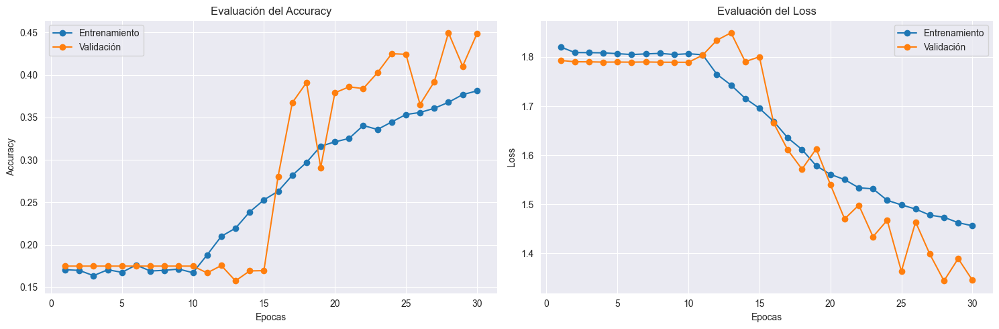

In [23]:
def curvas_entrenamiento(history1, history2):
    acc = history1.history['accuracy'] + history2.history['accuracy']
    val_acc = history1.history['val_accuracy'] + history2.history['val_accuracy']
    loss = history1.history['loss'] + history2.history['loss']
    val_loss = history1.history['val_loss'] + history2.history['val_loss']

    epochs = range(1, len(acc) + 1)

    plt.figure(figsize=(15, 5))
    plt.subplot(1, 2, 1)
    plt.plot(epochs, acc, 'o-', label='Entrenamiento')
    plt.plot(epochs, val_acc, 'o-', label='Validación')
    plt.title('Evaluación del Accuracy')
    plt.xlabel('Epocas')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.grid(True)

    plt.subplot(1, 2, 2)
    plt.plot(epochs, loss, 'o-', label='Entrenamiento')
    plt.plot(epochs, val_loss, 'o-', label='Validación')
    plt.title('Evaluación del Loss')
    plt.xlabel('Epocas')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)

    plt.tight_layout()
    plt.show()


curvas_entrenamiento(history4_fase1, history4_fase2)

In [24]:
y_true = val_generator4.classes
y_pred = np.argmax(modelo4.predict(val_generator4), axis=1)

94/94 [==============================] - 55s 546ms/step


In [25]:
cm = confusion_matrix(y_true, y_pred)
labels = list(val_generator4.class_indices.keys())

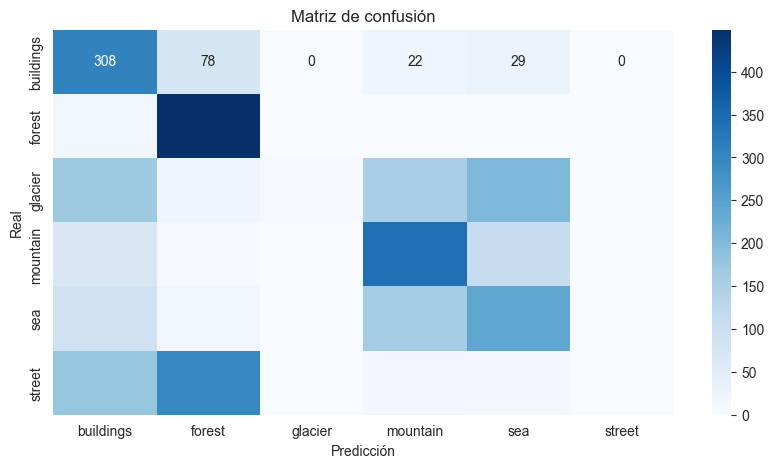

In [26]:
plt.figure(figsize=(10, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.xlabel('Predicción')
plt.ylabel('Real')
plt.title('Matriz de confusión')
plt.show()

In [28]:
print('Reporte de clasificación')
print(classification_report(y_true, y_pred, target_names=labels))

Reporte de clasificación
              precision    recall  f1-score   support

   buildings       0.37      0.70      0.49       437
      forest       0.52      0.95      0.67       474
     glacier       0.78      0.01      0.02       553
    mountain       0.49      0.65      0.56       525
         sea       0.40      0.47      0.44       510
      street       0.00      0.00      0.00       501

    accuracy                           0.45      3000
   macro avg       0.43      0.46      0.36      3000
weighted avg       0.43      0.45      0.35      3000



C:\ProgramData\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\ProgramData\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\ProgramData\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


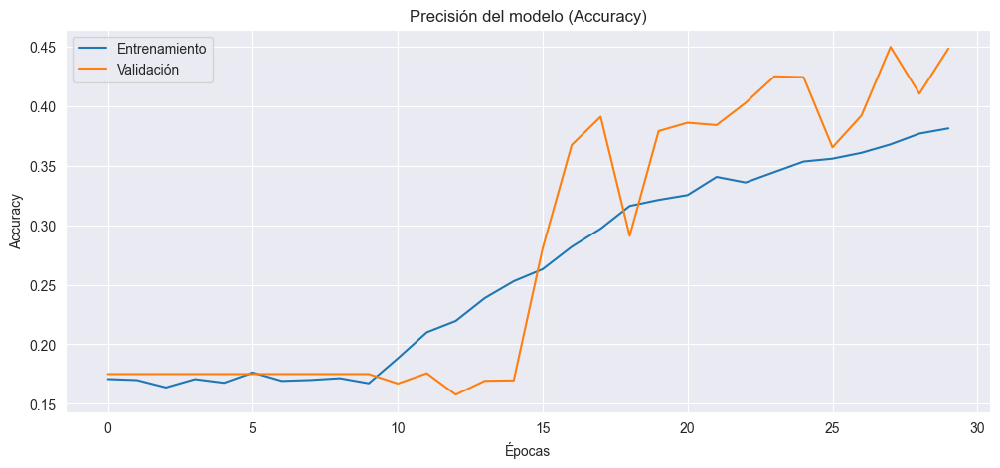

In [36]:
plt.figure(figsize=(12, 5))
plt.plot(history4_fase1.history['accuracy'] + history4_fase2.history['accuracy'], label='Entrenamiento')
plt.plot(history4_fase1.history['val_accuracy'] + history4_fase2.history['val_accuracy'], label='Validación')
plt.title("Precisión del modelo (Accuracy)")
plt.xlabel("Épocas")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

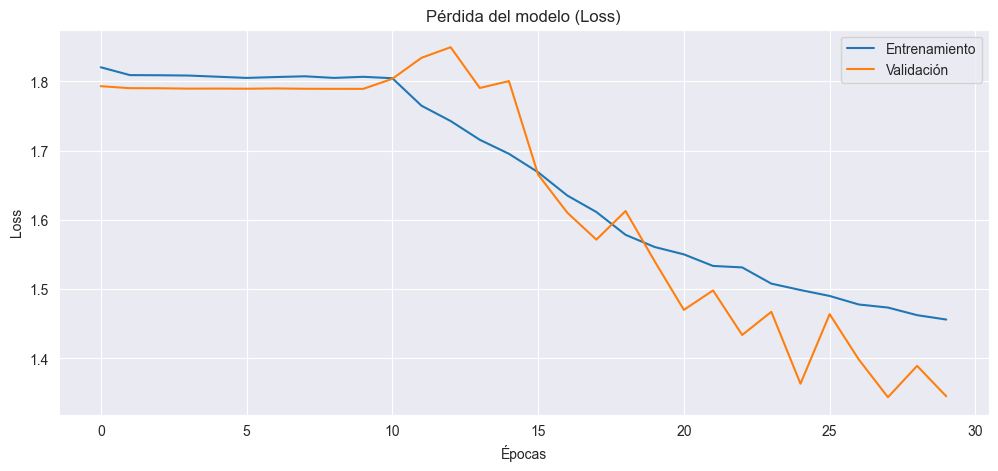

In [34]:
plt.figure(figsize=(12, 5))
plt.plot(history4_fase1.history['loss'] + history4_fase2.history['loss'], label='Entrenamiento')
plt.plot(history4_fase1.history['val_loss'] + history4_fase2.history['val_loss'], label='Validación')
plt.title("Pérdida del modelo (Loss)")
plt.xlabel("Épocas")
plt.ylabel("Loss")
plt.legend()
plt.show()

In [44]:
images_ = []
labels_ = []
for batch_img, batch_lbls in val_generator4:
     images_.append(batch_img)
     labels_.append(batch_lbls)
     if len(images_) * val_generator4.batch_size >= val_generator4.samples:
         break

images_ = np.vstack(images_)
labels_ = np.vstack(labels_)



In [45]:
pred = modelo4.predict(images_)
true_classes = val_generator4.classes


94/94 [==============================] - 50s 531ms/step


In [38]:
correctos = np.where(y_pred == true_classes)[0]
incorrectos = np.where(y_pred != true_classes)[0]
clases = list(train_generator4.class_indices.keys())

In [48]:
def resultados(indices, title, n=9):
    plt.figure(figsize=(10, 10))
    plt.suptitle(title, fontsize=16)
    for i, idx in enumerate(indices[:n]):
        plt.subplot(3, 3, i + 1)
        img_path = val_generator4.filepaths[idx]
        img = plt.imread(img_path)
        plt.imshow(img)
        plt.title(f"Real: {clases[true_classes[idx]]}\nPred: {clases[y_pred[idx]]}")
        plt.axis("off")
    plt.show()

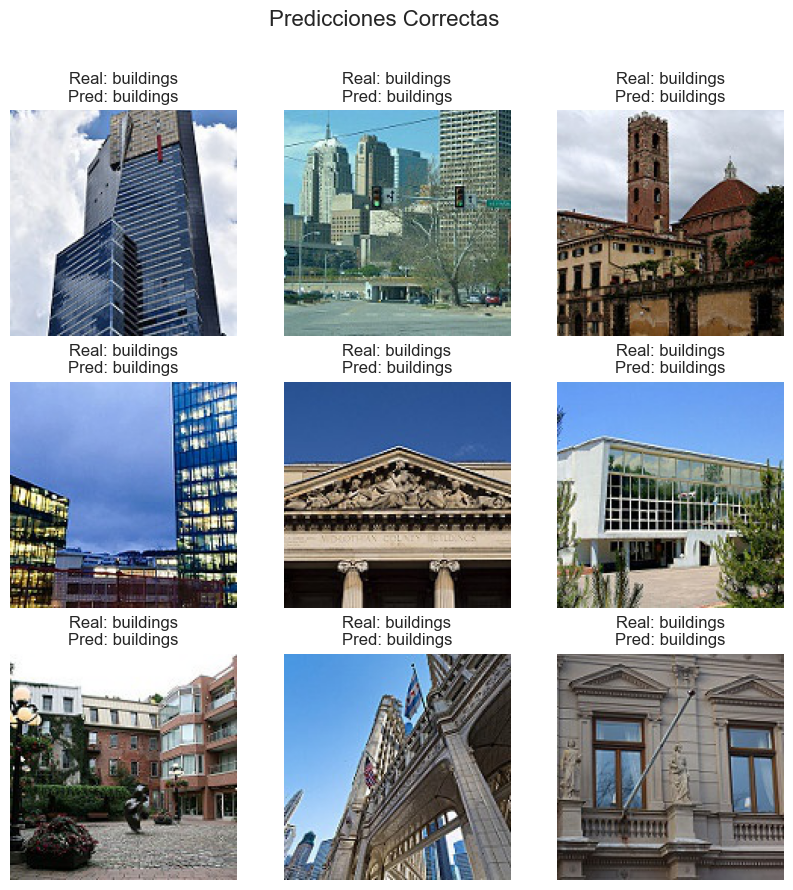

In [51]:
resultados(correctos, "Predicciones Correctas", n=9)

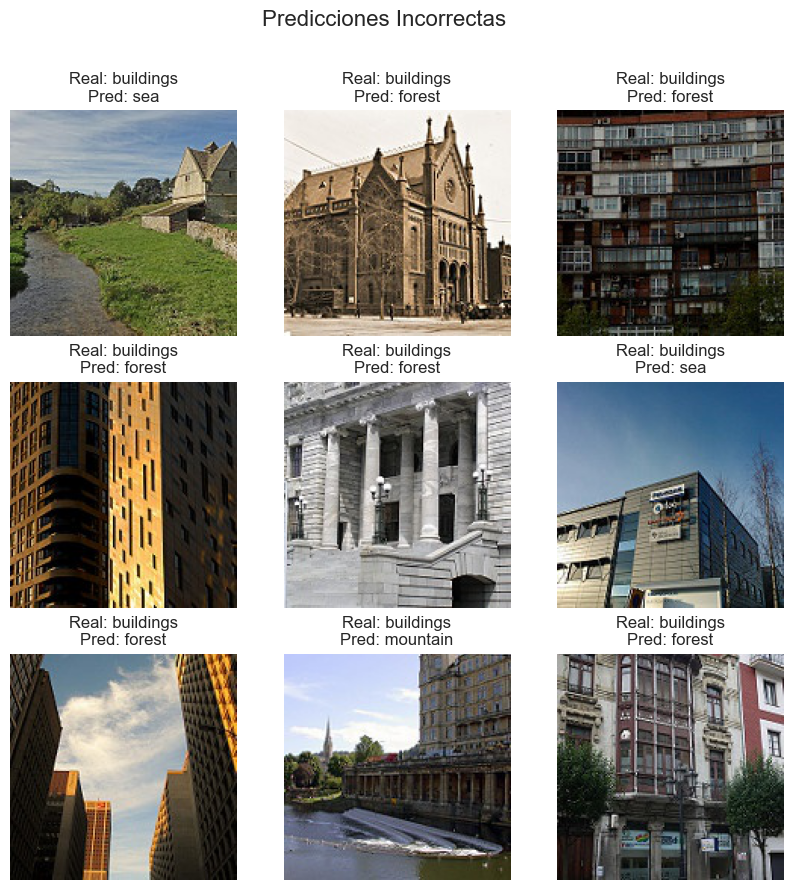

In [50]:
resultados(incorrectos, "Predicciones Incorrectas", n=9)

# Entrenamiento con ResNEt50

In [6]:
data_trainRS = 'G:/Intel/seg_train'
data_testRS = 'G:/Intel/seg_test'
data_pathRS = 'G:/Intel/seg_train'

In [8]:
img_size = (224, 224)
batch_size = 32
epochs = 15
#learnig_rate = 1e-4
lr = 1e-4

In [9]:
train_datagenRS = ImageDataGenerator(
    rescale=1./255,
    rotation_range=90,
    width_shift_range=0.2,
    height_shift_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

In [10]:
val_datagenRS = ImageDataGenerator(
    rescale=1./255,
)

In [11]:
train_generatorRS = train_datagenRS.flow_from_directory(
    data_trainRS,
    target_size=img_size,
    batch_size=batch_size,
    class_mode='categorical',

)

Found 14034 images belonging to 6 classes.


In [13]:
val_generatorRS = val_datagenRS.flow_from_directory(
    data_testRS,
    target_size = img_size,
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=False
)

Found 3000 images belonging to 6 classes.


In [14]:
base_model = ResNet50(
    weights='imagenet',
    include_top=False,
    input_shape=(img_size[0], img_size[1], 3)
)



94765736/94765736 [==============================] - 8s 0us/step


In [15]:
for layer in base_model.layers:
    layer.trainable = False

In [16]:
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dropout(0.2)(x)
x = Dense(512, activation='relu')(x)
x = Dropout(0.2)(x)

In [17]:
predictios = Dense(train_generatorRS.num_classes, activation='softmax')(x)

In [18]:
modelo_resnet = Model(
    inputs=base_model.input,
    outputs=predictios
)


In [19]:
modelo_resnet.compile(
    optimizer=Adam(learning_rate=lr),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

In [21]:
modelo_resnet.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 conv1_pad (ZeroPadding2D)   (None, 230, 230, 3)          0         ['input_1[0][0]']             
                                                                                                  
 conv1_conv (Conv2D)         (None, 112, 112, 64)         9472      ['conv1_pad[0][0]']           
                                                                                                  
 conv1_bn (BatchNormalizati  (None, 112, 112, 64)         256       ['conv1_conv[0][0]']          
 on)                                                                                          

In [22]:
early_stop = EarlyStopping(monitor="val_loss", patience=4, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor="val_loss", factor=0.3, patience=2, verbose=1)
checkpoint = ModelCheckpoint("mejor_modelo_resnet.h5", monitor="val_accuracy", save_best_only=True)

In [24]:
history_resnet = modelo_resnet.fit(
    train_generatorRS,
    epochs=epochs,
    validation_data = val_generatorRS,
    callbacks=[early_stop, reduce_lr, checkpoint]
)

Epoch 1/15
439/439 [==============================] - ETA: 0s - loss: 1.7454 - accuracy: 0.2401

C:\Users\Lalo\AppData\Roaming\Python\Python311\site-packages\keras\src\engine\training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


439/439 [==============================] - 1930s 4s/step - loss: 1.7454 - accuracy: 0.2401 - val_loss: 1.6320 - val_accuracy: 0.3030 - lr: 1.0000e-04
Epoch 2/15
439/439 [==============================] - 1869s 4s/step - loss: 1.6378 - accuracy: 0.2875 - val_loss: 1.5814 - val_accuracy: 0.3287 - lr: 1.0000e-04
Epoch 3/15
439/439 [==============================] - 1848s 4s/step - loss: 1.6014 - accuracy: 0.3114 - val_loss: 1.5482 - val_accuracy: 0.3410 - lr: 1.0000e-04
Epoch 4/15
439/439 [==============================] - 1882s 4s/step - loss: 1.5750 - accuracy: 0.3231 - val_loss: 1.5199 - val_accuracy: 0.3643 - lr: 1.0000e-04
Epoch 5/15
439/439 [==============================] - 1952s 4s/step - loss: 1.5563 - accuracy: 0.3367 - val_loss: 1.5318 - val_accuracy: 0.3207 - lr: 1.0000e-04
Epoch 6/15
439/439 [==============================] - 2455s 6s/step - loss: 1.5410 - accuracy: 0.3454 - val_loss: 1.5144 - val_accuracy: 0.4013 - lr: 1.0000e-04
Epoch 7/15
439/439 [=========================

In [26]:
history_dict = history_resnet.history
epochs_range = range(1, len(history_dict['accuracy']) + 1)

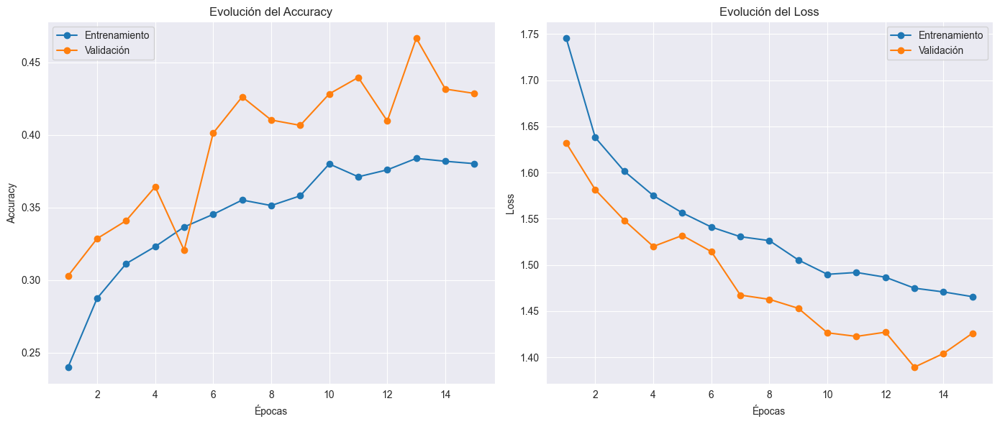

In [28]:
plt.figure(figsize=(14,6))

plt.subplot(1,2,1)
plt.plot(epochs_range, history_dict['accuracy'], 'o-', label='Entrenamiento')
plt.plot(epochs_range, history_dict['val_accuracy'], 'o-', label='Validación')
plt.title('Evolución del Accuracy')
plt.xlabel('Épocas')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)

plt.subplot(1,2,2)
plt.plot(epochs_range, history_dict['loss'], 'o-', label='Entrenamiento')
plt.plot(epochs_range, history_dict['val_loss'], 'o-', label='Validación')
plt.title('Evolución del Loss')
plt.xlabel('Épocas')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

In [29]:
val_loss, val_acc = modelo_resnet.evaluate(val_generatorRS)
print(f'Perdida en validación {val_loss:.4f}')
print(f'Accuracy en validación {val_acc:.4f}')

94/94 [==============================] - 379s 4s/step - loss: 1.4260 - accuracy: 0.4287
Perdida en validación 1.4260
Accuracy en validación 0.4287


In [30]:
y_predRS =  modelo_resnet.predict(val_generatorRS)
y_pred_clasess = np.argmax(y_predRS, axis=1)
y_trueRS = val_generatorRS.classes
class_labels = list(val_generatorRS.class_indices.keys())

94/94 [==============================] - 386s 4s/step


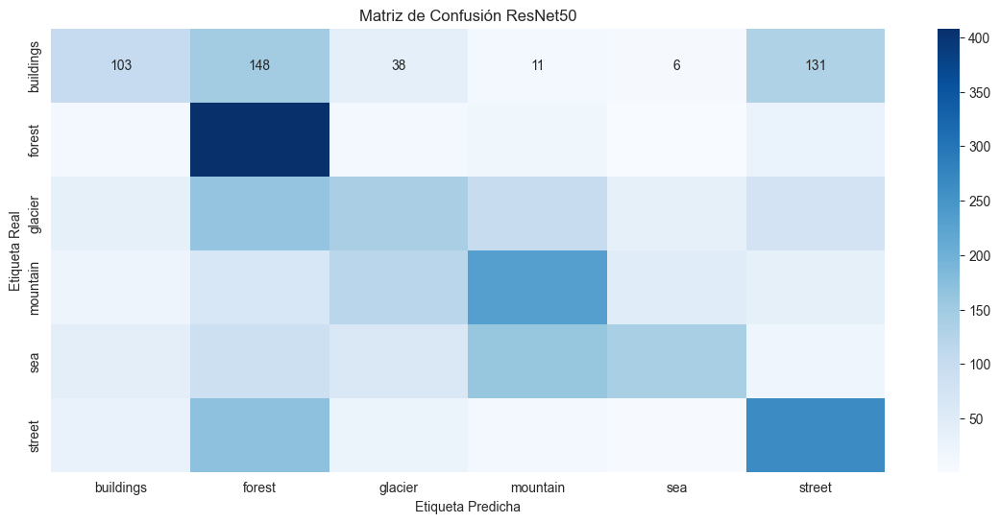

In [31]:
cm = confusion_matrix(y_trueRS, y_pred_clasess)
plt.figure(figsize=(14,6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_labels, yticklabels=class_labels)
plt.title('Matriz de Confusión ResNet50')
plt.ylabel('Etiqueta Real')
plt.xlabel('Etiqueta Predicha')
plt.show()

In [32]:
print('Repoerte de Clasificación')
print(classification_report(y_trueRS, y_pred_clasess, target_names=class_labels))

Repoerte de Clasificación
              precision    recall  f1-score   support

   buildings       0.42      0.24      0.30       437
      forest       0.39      0.86      0.54       474
     glacier       0.36      0.25      0.30       553
    mountain       0.44      0.44      0.44       525
         sea       0.59      0.27      0.38       510
      street       0.47      0.53      0.50       501

    accuracy                           0.43      3000
   macro avg       0.45      0.43      0.41      3000
weighted avg       0.45      0.43      0.41      3000



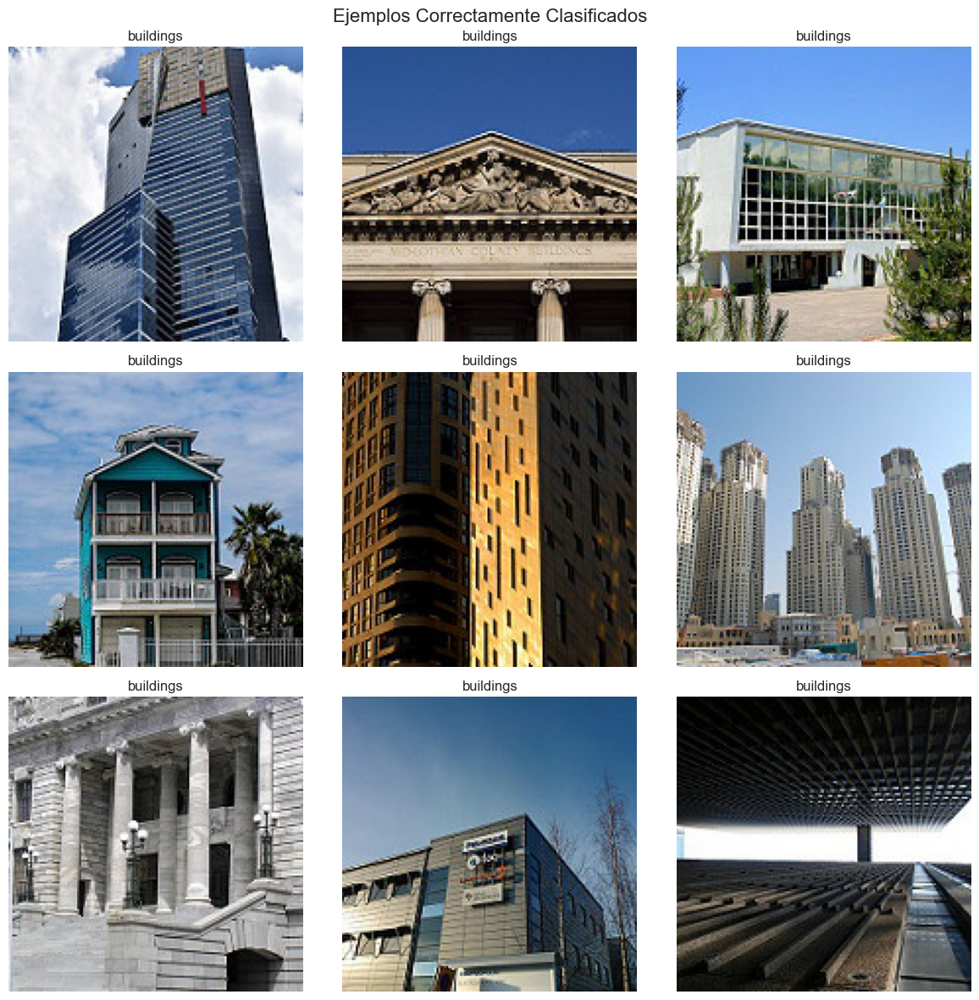

In [36]:
correct_indices = np.where(y_pred_clasess == y_trueRS)[0]
plt.figure(figsize=(12, 12))
for i, idx in enumerate(correct_indices[:9]):
    plt.subplot(3, 3, i + 1)
    img_path = val_generatorRS.filepaths[idx]
    img = plt.imread(img_path)
    plt.imshow(img)
    plt.title(f"{class_labels[y_trueRS[idx]]}")
    plt.axis("off")
plt.suptitle("Ejemplos Correctamente Clasificados", fontsize=16)
plt.tight_layout()
plt.show()

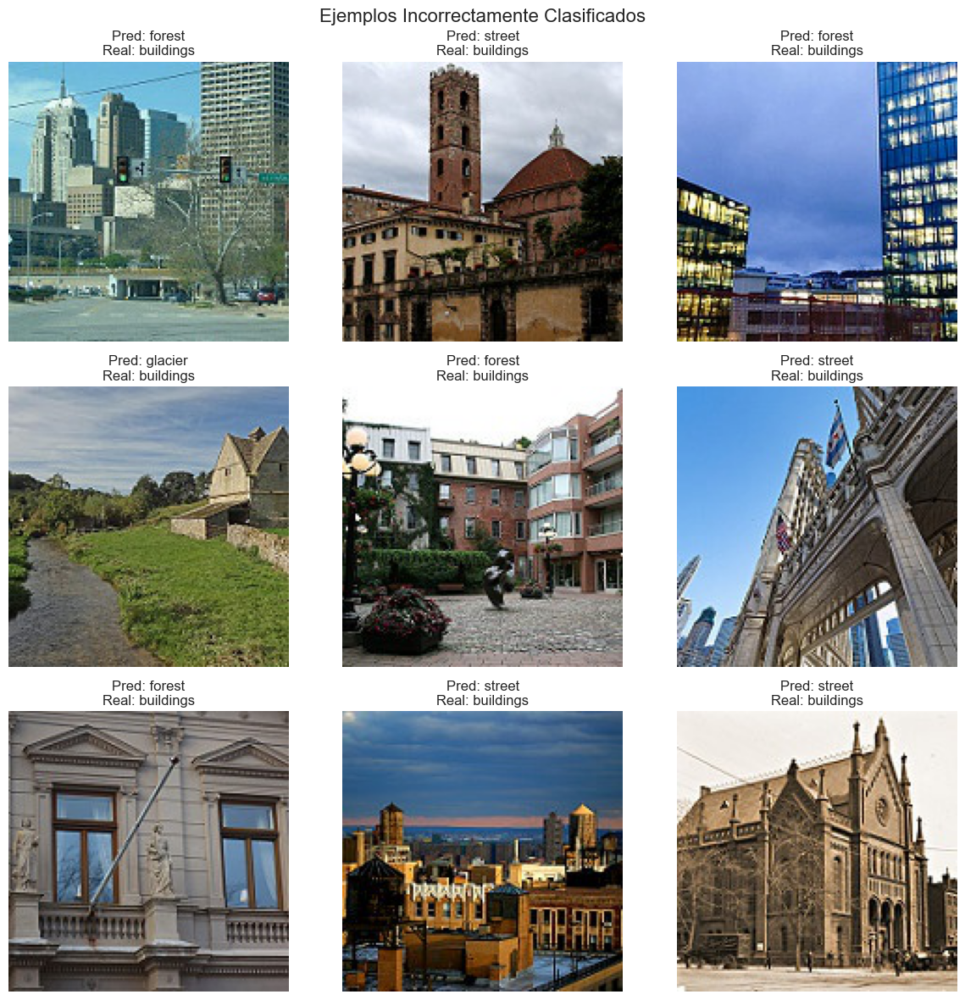

In [35]:
incorrect_indices = np.where(y_pred_clasess != y_trueRS)[0]
plt.figure(figsize=(12, 12))
for i, idx in enumerate(incorrect_indices[:9]):
    plt.subplot(3, 3, i + 1)
    img_path = val_generatorRS.filepaths[idx]
    img = plt.imread(img_path)
    plt.imshow(img)
    plt.title(f"Pred: {class_labels[y_pred_clasess[idx]]}\nReal: {class_labels[y_trueRS[idx]]}")
    plt.axis("off")
plt.suptitle("Ejemplos Incorrectamente Clasificados", fontsize=16)
plt.tight_layout()
plt.show()

In [38]:
modelo_resnet.save('mi_modelo_ResNet50.keras')

## Los modelos EfficientNet y ResNet50 ya no fueron documentados ya que practicamente el lo mismo que los primeros 3, solo cambian un par de cosas. como la integracion de las aruitecturas, el dataset es es el mismo, las epocas 10 y 15. Si hay alguna duda, pueden ver lo documentado de los primero modelos.

# Comparativa de todos los modelos entrenados

## Modelo 1, 2 y 3 con CNN (10, 20 y 30 epochs)
## EfficientNet (10 epochs)
## Resnet (15 epochs)

| # | Modelo            | Épocas | Acc Train | Acc Val | Loss Train | Loss Val | Precisión Entrenamiento | Precisión Validacion |
|---|-------------------|--------|-----------|---------|------------|----------|-------------------------|----------------------|
| 1 | CNN capas propias | 10     | 0.6615    | 0.7559  | 0.9054     | 0.7598   | 66.1%                   | 75.6%                |
| 2 | CNN capas propias | 20     | 0.7739    | 0.8110  | 0.6292     | 0.5713   | 77.3$                   | 81.1%                |
| 3 | CNN capas propias | 30     | 0.8506    | 0.8683  | 0.4292     | 0.3754   | 85.0%                   | 86.8%                |
| 4 | EfficentNet       | 10     | 0.1672    | 0.1750  | 1.8068     | 1.7893   | 17.0%                   | 17.5%                |
| 4 | ResNet50          | 15     | 0.3803    | 0.4287  | 1.4656     | 1.4260   | 38.0%                   | 42.8%                |


# Explicación
- Accuracy (precisión): Porcentaje de aciertos del modelo, Mientras mas alto mejor.
- Loss (pérdida): Mide qué tan equivocadas están las predicciones del modelo, mientras más bajo mejor.
- Val Accuacry: Precisión sobre dartos nuevos, los que no se ven durante el entrenamiento, permite saber si el modelo generaliza bien.
- Val Loss: Perdida en datos de validación, si es muy alta se tiene sobre ajustes, si es similar al loss de entrenamiento, el modelo generaliza bien.

# Mejor modelo
- El tercer entrenamiento es el mejor modelo.
- Precisión en validación es del 86.6%
- Perdida en validación es del 0.3754
- Épocas 30
- Se tiene un buen balance entre el entrenamiento y la validación.

# Peor modelo
- EfficientNet
- Precisión de solo 17.5%
- No logro aprender
- Se tiene una tasa de aprendizaje baja o la arquitectura es poco adecuada para los datos.

# Resumen final
- Para este proyecto realizamos 5 entrenamientos, 3 con capas CNN, con arquitecturas ResNet5o y EfficentNet, despues de ver los resultados y comparar las métricas, la precisión, la generalización, el modelo final seleccionado fue el modelo 3 con 30 épocas, nos da un buen rendimiento estable y robusto.
- Esto nos dice que este modelo puede clasificar imágenes del dataset con alto nivel de confianza y generaliza bien sobre los datos.






